<h1 style="font-size: 38px; text-align: center; color: blue">The implementation of deep learning to develop an adequate tool for identifying the bumblebee species in Ireland</h1>

<br> </br>

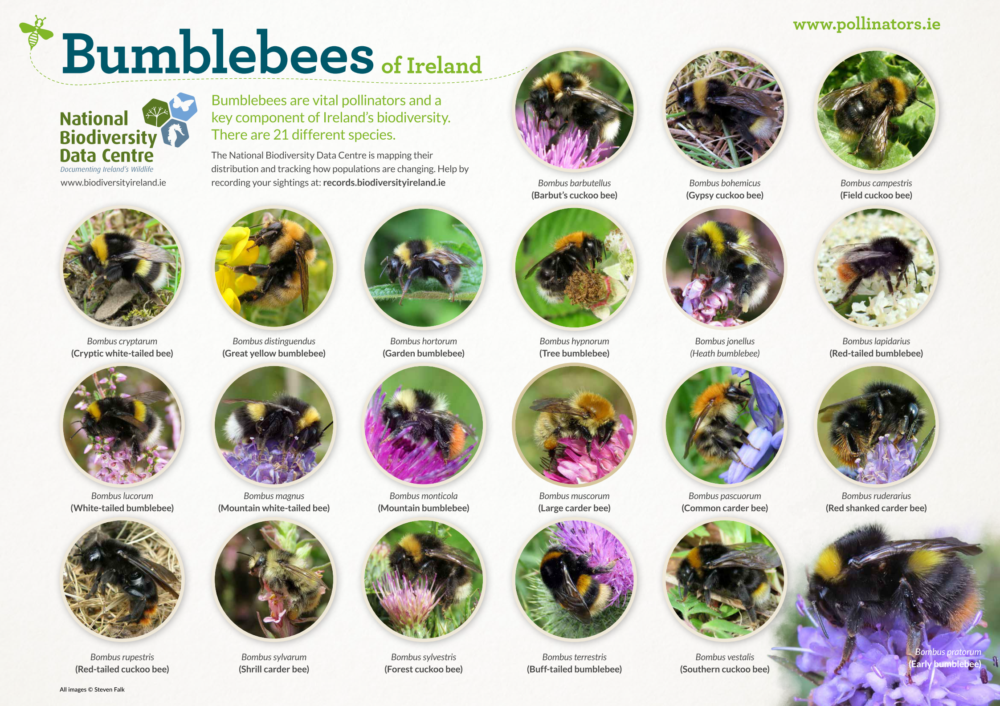

<br> </br>

In [1]:
# Import libraries
import os
import shutil
import random
import xml.etree.ElementTree as ET
import cv2

import warnings
warnings.filterwarnings("ignore")

# Import libraries
import pathlib
import itertools
import glob
import numpy as np

import PIL
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

<br> </br>

<h1 style="font-size: 28px; text-align: center; color: green"> 2. Deep Learning Models Training using Tensorflow and Keras</h1>

<br> </br>

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import Sequence
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Activation, Dense, Flatten, Dropout, ZeroPadding2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

2023-12-01 23:52:04.940928: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-01 23:52:04.967868: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-01 23:52:04.967894: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-01 23:52:04.968563: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-01 23:52:04.973009: I tensorflow/core/platform/cpu_feature_guar

In [3]:
# Set data directory for training, validating and testing
training_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/train/')
validate_data_dir = pathlib.Path('/home/hduser/Desktop/final dataset testing/machine learning/validate/')

print(training_data_dir)
print(validate_data_dir)

/home/hduser/Desktop/final dataset testing/machine learning/train
/home/hduser/Desktop/final dataset testing/machine learning/validate


<br> </br>
- **Check the image in the train folder**

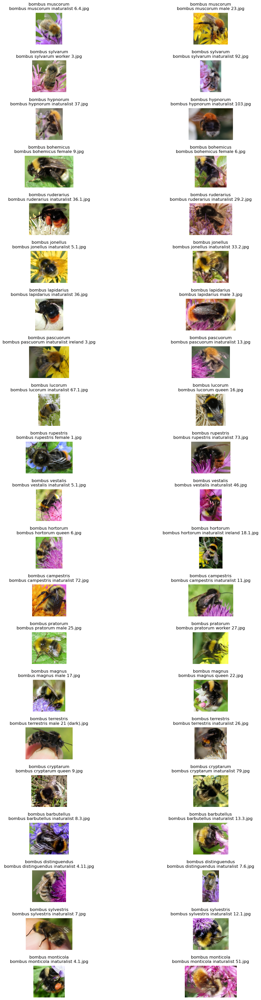

In [4]:
# Get the list of subdirectories (species)
species_list = [subdir.name for subdir in training_data_dir.glob('*')]

# Create a subplot grid
fig, axes = plt.subplots(21, 2, figsize=(15, 50))

# Adjust layout to provide space for titles
plt.subplots_adjust(hspace=0.5)

# Loop through each species
for i, species in enumerate(species_list):
    # Get two images from each species
    species_images = list(training_data_dir.glob(f'{species}/*'))[:2]

    # Loop through each image for the species
    for j, image_path in enumerate(species_images):
        image = Image.open(str(image_path))

        # Extract filename from path
        filename = os.path.basename(image_path)

        # Display the image on the subplot
        axes[i, j].imshow(image)
        axes[i, j].set_title(f'{species}\n{filename}', y=1.02)  # Adjust y position for title
        axes[i, j].axis('off')

plt.show()

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: orange"> Data Augmentation </h1>
<br> </br>

- <h1 style="font-size: 16px"> RandomPadding and Cropping and Some popular geometric transformation methods </h1> </h1>
<br> </br>

In [5]:
def create_augmented_train_batches_keras(training_data_dir, img_height, img_width, model):
    batch_size = 32

    train_batches = ImageDataGenerator(preprocessing_function=model.preprocess_input) \
        .flow_from_directory(
            training_data_dir,
            class_mode='categorical',
            target_size=(img_height, img_width),
            batch_size=batch_size,
            shuffle=True,
            seed=42
        )

    random_padding_cropping = ImageDataGenerator(
        preprocessing_function=model.preprocess_input,
        width_shift_range=0.25,
        height_shift_range=0.25,
        fill_mode='constant',
        cval=0
    )

    padded_train_batches = random_padding_cropping.flow_from_directory(
        training_data_dir,
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )

    random_geometric_transformation = ImageDataGenerator(
        preprocessing_function=model.preprocess_input,
        horizontal_flip=True,
        vertical_flip=True,
        rotation_range=30,
        zoom_range=0.2,
        brightness_range=(0.9, 0.98)
    )

    geometric_train_batches = random_geometric_transformation.flow_from_directory(
        training_data_dir,
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )

    class ConcatenateGenerators(Sequence):
        def __init__(self, *generators):
            self.generators = generators
            self.batch_size = min(gen.batch_size for gen in generators)
            self.n = sum(len(gen) * self.batch_size for gen in generators)

        def __len__(self):
            return self.n // self.batch_size

        def __getitem__(self, index):
            for gen in self.generators:
                if index < len(gen) * self.batch_size:
                    return gen[index % len(gen)]

                index -= len(gen) * self.batch_size

    train_batches_combined = ConcatenateGenerators(train_batches, padded_train_batches,
                                                   geometric_train_batches)

    # Return all batches
    return train_batches, padded_train_batches, geometric_train_batches, train_batches_combined

In [6]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 10, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.1 InceptionV3 </h1>
<br> </br>

In [7]:
inception_model = tf.keras.applications.inception_v3
img_height_incep, img_width_incep = (299, 299)
train_batches, padded_train_batches, geometric_train_batches, \
inception_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_incep,
    img_width_incep,
    inception_model
)

Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.


In [8]:
print(len(inception_train_batches))

285


In [9]:
print(inception_train_batches.n)

9120


In [10]:
# Specify image size and batch size
img_height_incep, img_width_incep = (299, 299)
batch_size = 32

In [11]:
validate_batches_incep = ImageDataGenerator(preprocessing_function=
                                            tf.keras.applications.inception_v3.preprocess_input) \
                    .flow_from_directory(validate_data_dir, target_size=(img_height_incep, img_width_incep),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True, seed=42)

Found 756 images belonging to 21 classes.


In [12]:
print(len(train_batches))
print(len(padded_train_batches))
print(len(geometric_train_batches))

95
95
95


In [13]:
print(type(train_batches))
print(type(padded_train_batches))
print(type(geometric_train_batches))

<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

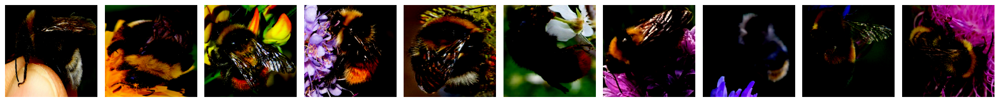

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [14]:
imgs, labels = next(train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

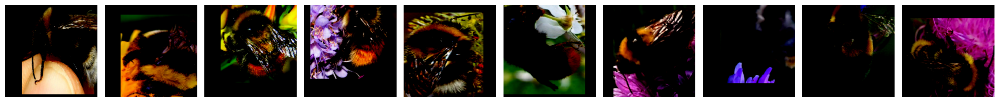

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [15]:
imgs, labels = next(padded_train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

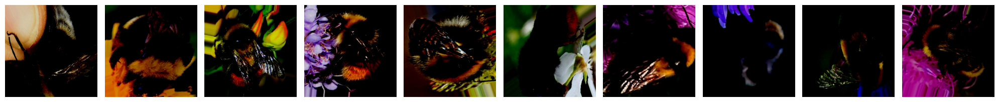

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [16]:
imgs, labels = next(geometric_train_batches)

plotImages(imgs)
print(labels)

In [17]:
inceptionv3 = tf.keras.applications.InceptionV3(
    include_top=False,
    input_shape=(299, 299, 3),
    pooling='avg',
    weights='imagenet')

for layer in inceptionv3.layers:
        layer.trainable=False

2023-12-01 23:52:09.183726: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:129] retrieving CUDA diagnostic information for host: alecfei-linuxlaptop
2023-12-01 23:52:09.183741: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:136] hostname: alecfei-linuxlaptop
2023-12-01 23:52:09.183816: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:159] libcuda reported version is: NOT_FOUND: was unable to find libcuda.so DSO loaded into this program
2023-12-01 23:52:09.183831: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:163] kernel reported version is: NOT_FOUND: could not find kernel module information in driver version file contents: "NVRM version: NVIDIA UNIX Open Kernel Module for x86_64  545.23.06  Release Build  (dvs-builder@U16-I3-C17-2-2)  Sun Oct 15 17:35:00 UTC 2023
GCC version:  gcc version 11.4.0 (Ubuntu 11.4.0-1ubuntu1~22.04) 
"


In [18]:
inceptionv3.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 149, 149, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 149, 149, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 149, 149, 32)         0         ['batch_normalizati

 conv2d_11 (Conv2D)          (None, 35, 35, 32)           6144      ['average_pooling2d[0][0]']   
                                                                                                  
 batch_normalization_5 (Bat  (None, 35, 35, 64)           192       ['conv2d_5[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_7 (Bat  (None, 35, 35, 64)           192       ['conv2d_7[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_10 (Ba  (None, 35, 35, 96)           288       ['conv2d_10[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_17 (Activation)  (None, 35, 35, 96)           0         ['batch_normalization_17[0][0]
                                                                    ']                            
                                                                                                  
 activation_18 (Activation)  (None, 35, 35, 64)           0         ['batch_normalization_18[0][0]
                                                                    ']                            
                                                                                                  
 mixed1 (Concatenate)        (None, 35, 35, 288)          0         ['activation_12[0][0]',       
                                                                     'activation_14[0][0]',       
                                                                     'activation_17[0][0]',       
          

                                                                                                  
 conv2d_28 (Conv2D)          (None, 35, 35, 96)           55296     ['activation_27[0][0]']       
                                                                                                  
 batch_normalization_28 (Ba  (None, 35, 35, 96)           288       ['conv2d_28[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_28 (Activation)  (None, 35, 35, 96)           0         ['batch_normalization_28[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_26 (Conv2D)          (None, 17, 17, 384)          995328    ['mixed2[0][0]']              
          

 conv2d_30 (Conv2D)          (None, 17, 17, 192)          147456    ['mixed3[0][0]']              
                                                                                                  
 conv2d_33 (Conv2D)          (None, 17, 17, 192)          172032    ['activation_32[0][0]']       
                                                                                                  
 conv2d_38 (Conv2D)          (None, 17, 17, 192)          172032    ['activation_37[0][0]']       
                                                                                                  
 conv2d_39 (Conv2D)          (None, 17, 17, 192)          147456    ['average_pooling2d_3[0][0]'] 
                                                                                                  
 batch_normalization_30 (Ba  (None, 17, 17, 192)          576       ['conv2d_30[0][0]']           
 tchNormalization)                                                                                
          

                                                                    ']                            
                                                                                                  
 average_pooling2d_4 (Avera  (None, 17, 17, 768)          0         ['mixed4[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_40 (Conv2D)          (None, 17, 17, 192)          147456    ['mixed4[0][0]']              
                                                                                                  
 conv2d_43 (Conv2D)          (None, 17, 17, 192)          215040    ['activation_42[0][0]']       
                                                                                                  
 conv2d_48 (Conv2D)          (None, 17, 17, 192)          215040    ['activation_47[0][0]']       
          

                                                                                                  
 activation_52 (Activation)  (None, 17, 17, 160)          0         ['batch_normalization_52[0][0]
                                                                    ']                            
                                                                                                  
 activation_57 (Activation)  (None, 17, 17, 160)          0         ['batch_normalization_57[0][0]
                                                                    ']                            
                                                                                                  
 average_pooling2d_5 (Avera  (None, 17, 17, 768)          0         ['mixed5[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_50

 batch_normalization_62 (Ba  (None, 17, 17, 192)          576       ['conv2d_62[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_67 (Ba  (None, 17, 17, 192)          576       ['conv2d_67[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_62 (Activation)  (None, 17, 17, 192)          0         ['batch_normalization_62[0][0]
                                                                    ']                            
                                                                                                  
 activation_67 (Activation)  (None, 17, 17, 192)          0         ['batch_normalization_67[0][0]
          

                                                                                                  
 conv2d_71 (Conv2D)          (None, 8, 8, 320)            552960    ['activation_70[0][0]']       
                                                                                                  
 conv2d_75 (Conv2D)          (None, 8, 8, 192)            331776    ['activation_74[0][0]']       
                                                                                                  
 batch_normalization_71 (Ba  (None, 8, 8, 320)            960       ['conv2d_71[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_75 (Ba  (None, 8, 8, 192)            576       ['conv2d_75[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_82 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_82[0][0]
                                                                    ']                            
                                                                                                  
 activation_83 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_83[0][0]
                                                                    ']                            
                                                                                                  
 batch_normalization_84 (Ba  (None, 8, 8, 192)            576       ['conv2d_84[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activatio

                                                                                                  
 activation_88 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_88[0][0]
                                                                    ']                            
                                                                                                  
 activation_91 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_91[0][0]
                                                                    ']                            
                                                                                                  
 activation_92 (Activation)  (None, 8, 8, 384)            0         ['batch_normalization_92[0][0]
                                                                    ']                            
                                                                                                  
 batch_nor

In [19]:
model_inceptionv3 = Sequential()

model_inceptionv3.add(inceptionv3)
model_inceptionv3.add(Flatten())
model_inceptionv3.add(Dense(512, activation='relu'))
model_inceptionv3.add(Dropout(0.2))
model_inceptionv3.add(Dense(21, activation='softmax'))

In [20]:
model_inceptionv3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 21)                10773     
                                                                 
Total params: 22862645 (87.21 MB)
Trainable params: 1059861 (4.04 MB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


In [21]:
model_inceptionv3.compile(optimizer=Adam(learning_rate=0.001),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

In [22]:
epoch_inceptionv3 = 10

result_inceptionv3 = model_inceptionv3.fit(inception_train_batches,
                                           validation_data=validate_batches_incep,
                                           epochs=epoch_inceptionv3,
                                           verbose=2)

Epoch 1/10
285/285 - 169s - loss: 2.4760 - accuracy: 0.2521 - val_loss: 2.2010 - val_accuracy: 0.3241 - 169s/epoch - 594ms/step
Epoch 2/10
285/285 - 167s - loss: 1.7754 - accuracy: 0.4454 - val_loss: 1.9609 - val_accuracy: 0.3624 - 167s/epoch - 586ms/step
Epoch 3/10
285/285 - 167s - loss: 1.4442 - accuracy: 0.5495 - val_loss: 1.9100 - val_accuracy: 0.3876 - 167s/epoch - 587ms/step
Epoch 4/10
285/285 - 168s - loss: 1.2078 - accuracy: 0.6214 - val_loss: 1.8079 - val_accuracy: 0.4339 - 168s/epoch - 588ms/step
Epoch 5/10
285/285 - 167s - loss: 1.0068 - accuracy: 0.6921 - val_loss: 1.8167 - val_accuracy: 0.4299 - 167s/epoch - 588ms/step
Epoch 6/10
285/285 - 167s - loss: 0.8444 - accuracy: 0.7402 - val_loss: 1.8443 - val_accuracy: 0.4392 - 167s/epoch - 587ms/step
Epoch 7/10
285/285 - 167s - loss: 0.6965 - accuracy: 0.7896 - val_loss: 1.9167 - val_accuracy: 0.4458 - 167s/epoch - 586ms/step
Epoch 8/10
285/285 - 167s - loss: 0.5716 - accuracy: 0.8372 - val_loss: 1.9016 - val_accuracy: 0.4550 - 

<br> </br>
- <h1 style="font-size: 16px"> Create functions for plotting model training results in Keras. </h1>
<br> </br>

In [23]:
# Create a function for plotting accuracy fluctuation

def plot_accuracy(epochs, history, model_name):
    plt.figure(figsize=(8, 8))
    
    epochs_range = range(1, epochs + 1)
    plt.plot(epochs_range, history['accuracy'], label="Training Accuracy", color='green')
    plt.plot(epochs_range, history['val_accuracy'], label="Validation Accuracy", color='blue', linestyle='--')
    
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Accuracy of {model_name} Model')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])
    
    plt.show()

In [24]:
# Create a function for plotting loss fluctuation

def plot_loss(epochs, history, model_name):
    plt.figure(figsize=(8, 8))
    
    epochs_range = range(1, epochs + 1)
    plt.plot(epochs_range, history['loss'], label="Training Loss", color='green')
    plt.plot(epochs_range, history['val_loss'], label="Validation Loss", color='blue', linestyle='--')

    plt.grid(True, alpha=0.7)
    
    plt.title(f'Train and Validation Loss of {model_name} Model')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'])

    plt.show()

In [25]:
# Create a function for plotting confusion matrix
def plot_confusion_matrix(model, batches, model_name):
    # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(np.argmax(batch_predictions, axis=1))
        
        # Extract true labels from the batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    # Compute the confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)

    # Plot the confusion matrix using seaborn
    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)

    # Loop to annotate each cell in the heatmap
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            plt.text(j + 0.5, i + 0.5, str(cm[i, j]), ha='center', va='center',
                     bbox=dict(facecolor='white', edgecolor='white', boxstyle='round,pad=0.3'))

    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix of {model_name} Model', fontsize=20)
    plt.show()

In [26]:
# Create a function for plotting report overview

def plot_classification_report(model, batches, model_name):
    # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(np.argmax(batch_predictions, axis=1))
        
        # Extract true labels from the batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    
    # Generate classification report dictionary
    report_dict = classification_report(true_labels, predicted_labels, 
                                        target_names=class_names, output_dict=True)

    # Extract metrics for each class
    precision = [report_dict[class_name]['precision'] for class_name in class_names]
    recall = [report_dict[class_name]['recall'] for class_name in class_names]
    f1_score = [report_dict[class_name]['f1-score'] for class_name in class_names]

    # Plotting using subplots
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(16, 18), sharex=True)

    # Plot precision
    axs[0].bar(class_names, precision, color='blue')
    axs[0].set_ylabel('Precision')
    axs[0].set_title('Precision by Class')
    axs[0].grid(True, alpha=0.5)

    # Plot recall
    axs[1].bar(class_names, recall, color='green')
    axs[1].set_ylabel('Recall')
    axs[1].set_title('Recall by Class')
    axs[1].grid(True, alpha=0.5)

    # Plot F1-score
    axs[2].bar(class_names, f1_score, color='orange')
    axs[2].set_xlabel('Class Names')
    axs[2].set_ylabel('F1-Score')
    axs[2].set_title('F1-Score by Class')
    axs[2].grid(True, alpha=0.5)

    # Adjust layout and rotate x-axis labels
    plt.tight_layout(pad=7.0)
    plt.xticks(rotation=45, ha='right')
    
    # Add a title on top
    plt.suptitle(f'Classification Report Overview of {model_name} Model', fontsize=20)

    plt.show()

In [27]:
# Create a function for printing classification report

def print_classification_report(model, batches):
   # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(np.argmax(batch_predictions, axis=1))
        
        # Extract true labels from the batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    # Generate classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_names)
    
    print("Classification Report:\n", report)

In [28]:
# Create a function for plotting ROC curves

def plot_roc_curves(model, batches, model_name):
    # Get the number of batches
    num_batches = len(batches)

    # Make predictions for each batch
    predictions = []
    true_labels = []

    for i in range(num_batches):
        # Get a batch of data
        batch_data, batch_labels = batches[i]

        # Make predictions for the batch
        batch_predictions = model.predict(batch_data)
        predictions.extend(batch_predictions)
        
        # Extract true labels from the batch
        true_labels.extend(batch_labels)

    # Convert lists to numpy arrays
    predicted_labels = np.array(predictions)
    true_labels = np.array(true_labels)

    # Get class names from the data generator
    class_names = list(batches.class_indices.keys())

    plt.figure(figsize=(14, 10))

    for class_index in range(len(class_names)):
        # Binarize true labels for the current class
        true_labels_bin = label_binarize(true_labels[:, class_index], classes=[0, 1])

        # Compute ROC curve and AUC
        fpr, tpr, _ = roc_curve(true_labels_bin, predicted_labels[:, class_index])
        auc_score = auc(fpr, tpr)

        label = f'{class_names[class_index]} (AUC = {auc_score:.2f})'
        plt.plot(fpr, tpr, label=label)

    plt.xlabel('False Positive Rate (Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    
    plt.title(f'ROC Curves of {model_name} Model', fontsize=16)
    plt.grid(True, alpha=0.5)
    plt.legend(loc='lower right', bbox_to_anchor=(1, 0), ncol=2, title="Species Name")

    plt.show()

<br> </br>

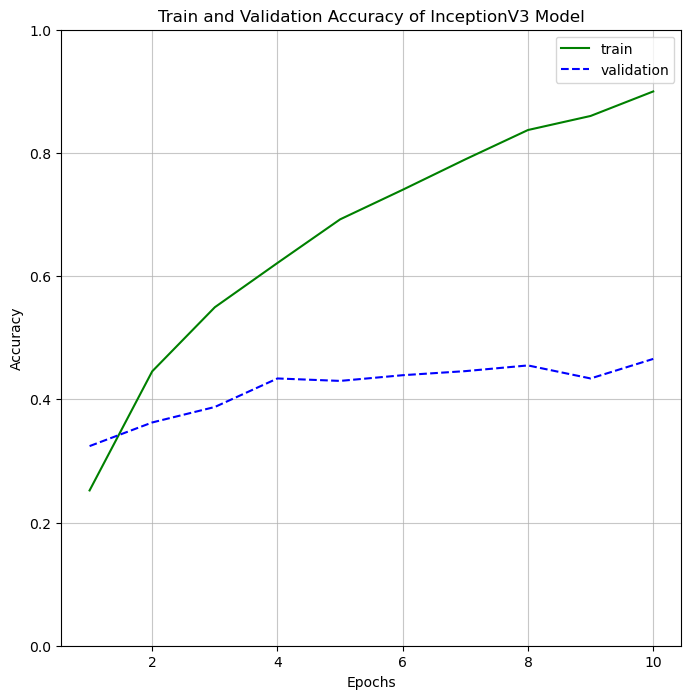

In [29]:
plot_accuracy(epoch_inceptionv3, result_inceptionv3.history, 'InceptionV3')

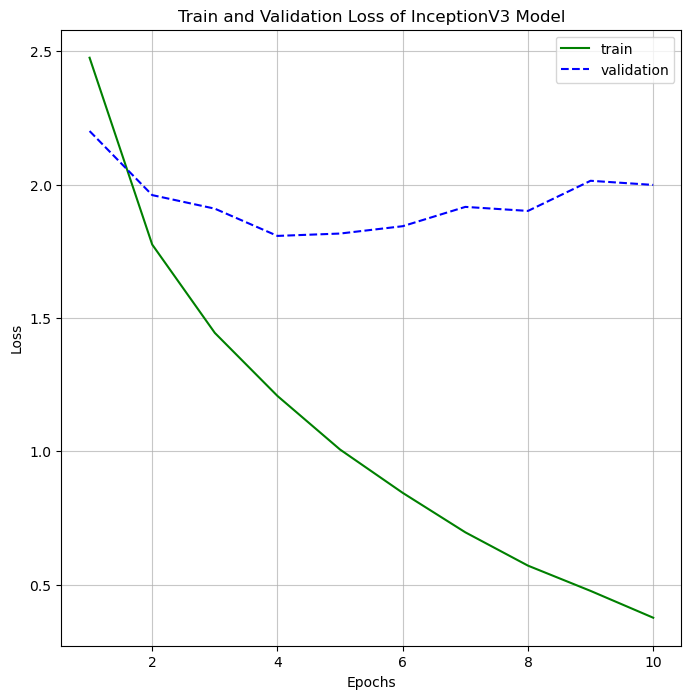

In [30]:
plot_loss(epoch_inceptionv3, result_inceptionv3.history, 'InceptionV3')

1/1 [==============================] - 1s 1s/step


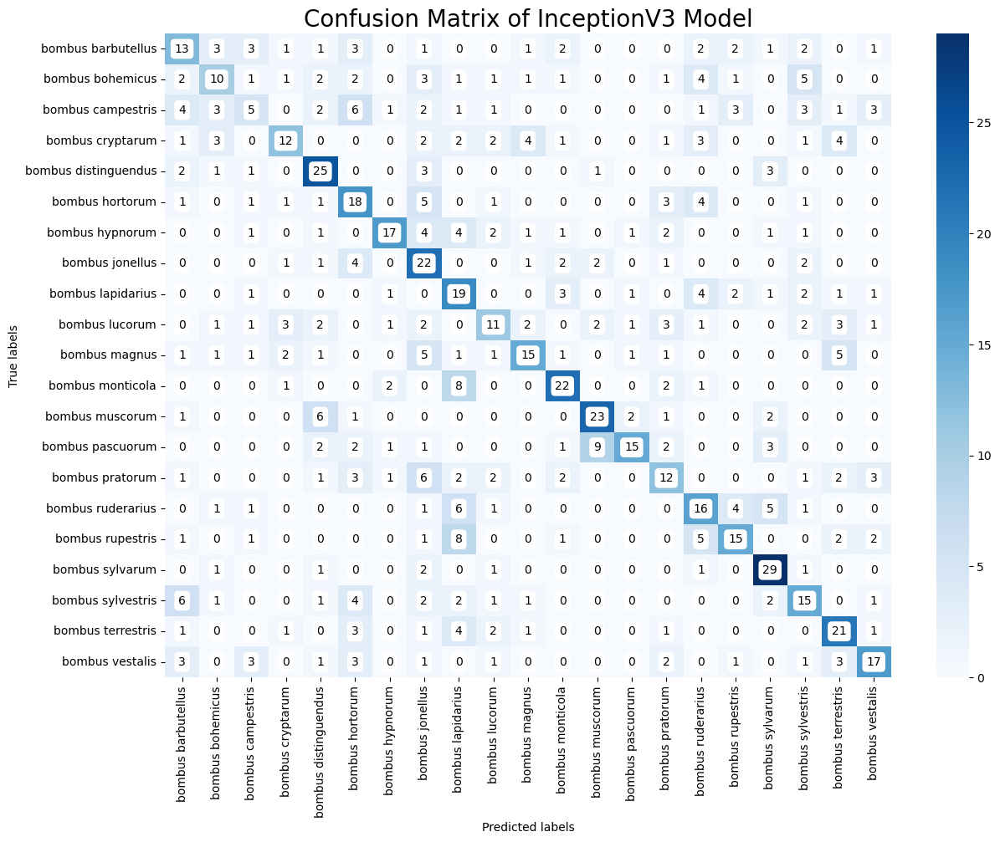

In [31]:
plot_confusion_matrix(model_inceptionv3, validate_batches_incep, 'InceptionV3')

1/1 [==============================] - 0s 349ms/step


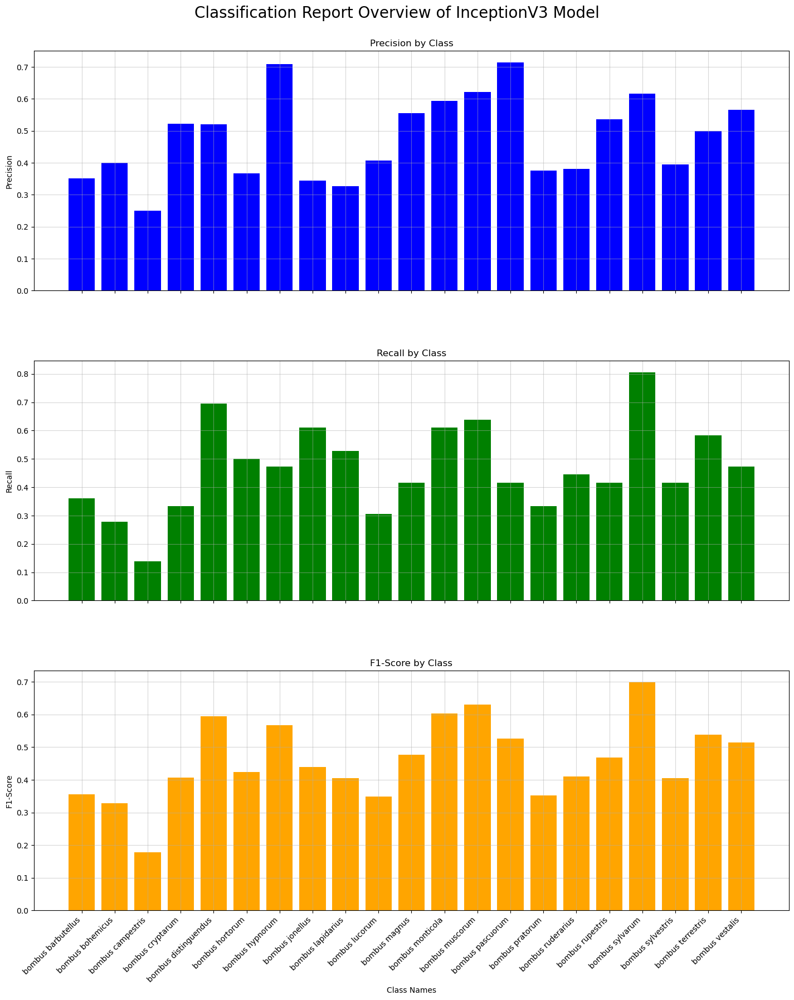

In [32]:
plot_classification_report(model_inceptionv3, validate_batches_incep, 'InceptionV3')

In [33]:
print_classification_report(model_inceptionv3, validate_batches_incep)

1/1 [==============================] - 0s 350ms/step
Classification Report:
                       precision    recall  f1-score   support

  bombus barbutellus       0.35      0.36      0.36        36
    bombus bohemicus       0.40      0.28      0.33        36
   bombus campestris       0.25      0.14      0.18        36
    bombus cryptarum       0.52      0.33      0.41        36
bombus distinguendus       0.52      0.69      0.60        36
     bombus hortorum       0.37      0.50      0.42        36
     bombus hypnorum       0.71      0.47      0.57        36
     bombus jonellus       0.34      0.61      0.44        36
   bombus lapidarius       0.33      0.53      0.40        36
      bombus lucorum       0.41      0.31      0.35        36
       bombus magnus       0.56      0.42      0.48        36
    bombus monticola       0.59      0.61      0.60        36
     bombus muscorum       0.62      0.64      0.63        36
    bombus pascuorum       0.71      0.42      0.53   

1/1 [==============================] - 0s 365ms/step


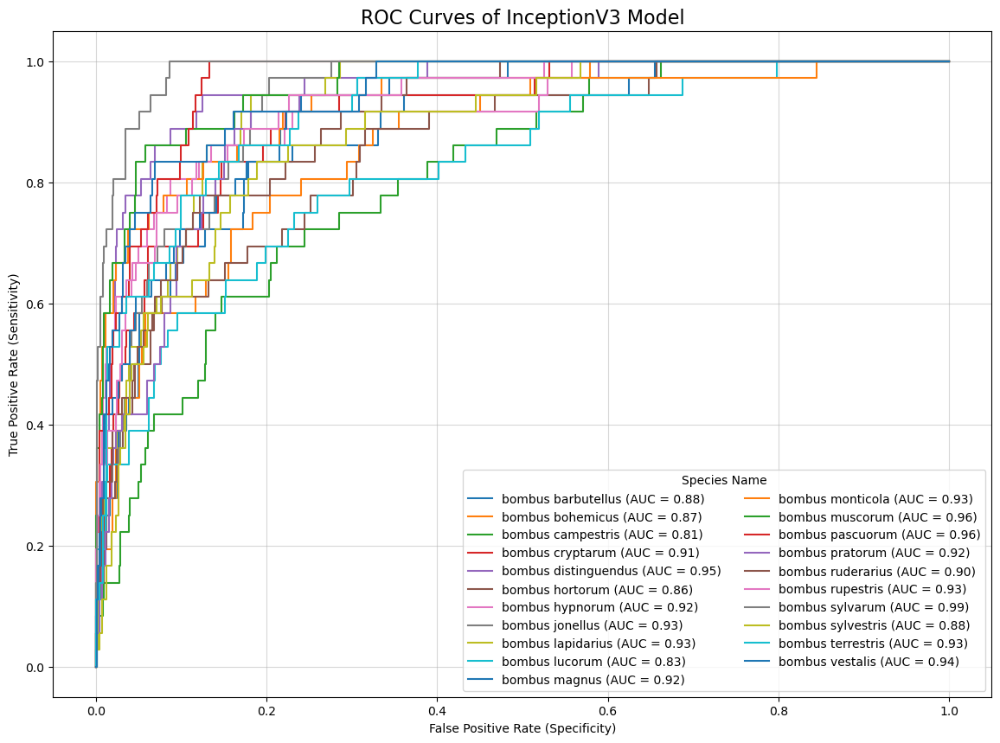

In [34]:
plot_roc_curves(model_inceptionv3, validate_batches_incep, 'InceptionV3')

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.2 ResNet101 </h1>
<br> </br>

In [35]:
resnet_model = tf.keras.applications.resnet
img_height_resnet, img_width_resnet = (224, 224)
train_batches, padded_train_batches, geometric_train_batches, \
resnet_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_resnet, 
    img_width_resnet, 
    resnet_model
)

Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.


In [36]:
print(len(resnet_train_batches))

285


In [37]:
print(resnet_train_batches.n)

9120


In [38]:
# Specify image size and batch size
img_height_resnet, img_width_resnet = (224, 224)
batch_size = 32

In [39]:
validate_batches_resnet = ImageDataGenerator(preprocessing_function=
                                            tf.keras.applications.resnet.preprocess_input) \
                    .flow_from_directory(validate_data_dir, target_size=(img_height_resnet, img_width_resnet),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True, seed=42)

Found 756 images belonging to 21 classes.


In [40]:
print(len(train_batches))
print(len(padded_train_batches))
print(len(geometric_train_batches))

95
95
95


In [41]:
print(type(train_batches))
print(type(padded_train_batches))
print(type(geometric_train_batches))

<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

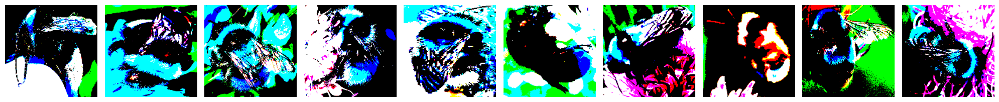

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [42]:
imgs, labels = next(train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

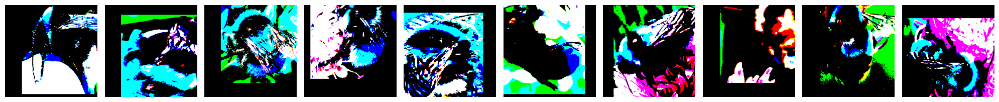

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [43]:
imgs, labels = next(padded_train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

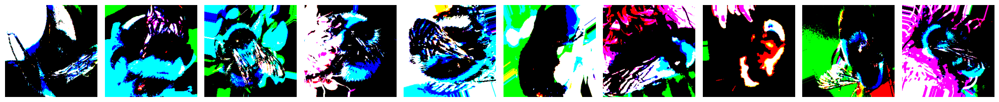

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [44]:
imgs, labels = next(geometric_train_batches)

plotImages(imgs)
print(labels)

In [45]:
resnet101 = tf.keras.applications.ResNet101(
    include_top=False,
    input_shape=(224, 224, 3),
    pooling='avg',
    weights='imagenet')

for layer in resnet101.layers:
        layer.trainable=False

In [46]:
resnet101.summary()

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                      

                                                                                                  
 conv2_block3_1_conv (Conv2  (None, 56, 56, 64)           16448     ['conv2_block2_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv2_block3_1_bn (BatchNo  (None, 56, 56, 64)           256       ['conv2_block3_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv2_block3_1_relu (Activ  (None, 56, 56, 64)           0         ['conv2_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv2_blo

 ation)                                                                                           
                                                                                                  
 conv3_block2_3_conv (Conv2  (None, 28, 28, 512)          66048     ['conv3_block2_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block2_3_bn (BatchNo  (None, 28, 28, 512)          2048      ['conv3_block2_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block2_add (Add)      (None, 28, 28, 512)          0         ['conv3_block1_out[0][0]',    
                                                                     'conv3_block2_3_bn[0][0]']   
          

 conv4_block1_2_conv (Conv2  (None, 14, 14, 256)          590080    ['conv4_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block1_2_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block1_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_2_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block1_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block1_0_conv (Conv2  (None, 14, 14, 1024)         525312    ['conv3_block4_out[0][0]']    
 D)       

                                                                                                  
 conv4_block3_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block3_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv4_block4_1_conv (Conv2  (None, 14, 14, 256)          262400    ['conv4_block3_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv4_block4_1_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block4_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_blo

 D)                                                                                               
                                                                                                  
 conv4_block6_3_bn (BatchNo  (None, 14, 14, 1024)         4096      ['conv4_block6_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block6_add (Add)      (None, 14, 14, 1024)         0         ['conv4_block5_out[0][0]',    
                                                                     'conv4_block6_3_bn[0][0]']   
                                                                                                  
 conv4_block6_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block6_add[0][0]']    
 on)                                                                                              
          

 conv4_block9_2_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block9_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block9_2_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block9_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block9_3_conv (Conv2  (None, 14, 14, 1024)         263168    ['conv4_block9_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block9_3_bn (BatchNo  (None, 14, 14, 1024)         4096      ['conv4_block9_3_conv[0][0]'] 
 rmalizati

                                                                                                  
 conv4_block12_1_relu (Acti  (None, 14, 14, 256)          0         ['conv4_block12_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block12_2_conv (Conv  (None, 14, 14, 256)          590080    ['conv4_block12_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block12_2_bn (BatchN  (None, 14, 14, 256)          1024      ['conv4_block12_2_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_blo

 ion)                                                                                             
                                                                                                  
 conv4_block15_1_conv (Conv  (None, 14, 14, 256)          262400    ['conv4_block14_out[0][0]']   
 2D)                                                                                              
                                                                                                  
 conv4_block15_1_bn (BatchN  (None, 14, 14, 256)          1024      ['conv4_block15_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block15_1_relu (Acti  (None, 14, 14, 256)          0         ['conv4_block15_1_bn[0][0]']  
 vation)                                                                                          
          

 conv4_block17_3_bn (BatchN  (None, 14, 14, 1024)         4096      ['conv4_block17_3_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block17_add (Add)     (None, 14, 14, 1024)         0         ['conv4_block16_out[0][0]',   
                                                                     'conv4_block17_3_bn[0][0]']  
                                                                                                  
 conv4_block17_out (Activat  (None, 14, 14, 1024)         0         ['conv4_block17_add[0][0]']   
 ion)                                                                                             
                                                                                                  
 conv4_block18_1_conv (Conv  (None, 14, 14, 256)          262400    ['conv4_block17_out[0][0]']   
 2D)      

                                                                                                  
 conv4_block20_2_relu (Acti  (None, 14, 14, 256)          0         ['conv4_block20_2_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block20_3_conv (Conv  (None, 14, 14, 1024)         263168    ['conv4_block20_2_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block20_3_bn (BatchN  (None, 14, 14, 1024)         4096      ['conv4_block20_3_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_blo

 vation)                                                                                          
                                                                                                  
 conv4_block23_2_conv (Conv  (None, 14, 14, 256)          590080    ['conv4_block23_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block23_2_bn (BatchN  (None, 14, 14, 256)          1024      ['conv4_block23_2_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block23_2_relu (Acti  (None, 14, 14, 256)          0         ['conv4_block23_2_bn[0][0]']  
 vation)                                                                                          
          

 conv5_block2_add (Add)      (None, 7, 7, 2048)           0         ['conv5_block1_out[0][0]',    
                                                                     'conv5_block2_3_bn[0][0]']   
                                                                                                  
 conv5_block2_out (Activati  (None, 7, 7, 2048)           0         ['conv5_block2_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv5_block3_1_conv (Conv2  (None, 7, 7, 512)            1049088   ['conv5_block2_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv5_block3_1_bn (BatchNo  (None, 7, 7, 512)            2048      ['conv5_block3_1_conv[0][0]'] 
 rmalizati

In [47]:
model_resnet101 = Sequential()

model_resnet101.add(resnet101)
model_resnet101.add(Flatten())
model_resnet101.add(Dense(512, activation='relu'))
model_resnet101.add(Dropout(0.2))
model_resnet101.add(Dense(21, activation='softmax'))

In [48]:
model_resnet101.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 2048)              42658176  
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 512)               1049088   
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 21)                10773     
                                                                 
Total params: 43718037 (166.77 MB)
Trainable params: 1059861 (4.04 MB)
Non-trainable params: 42658176 (162.73 MB)
_________________________________________________________________


In [49]:
model_resnet101.compile(optimizer=Adam(learning_rate=0.001),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

In [50]:
epoch_resnet101 = 10

result_resnet101 = model_resnet101.fit(resnet_train_batches,
                                       validation_data=validate_batches_resnet,
                                       epochs=epoch_resnet101,
                                       verbose=2)

Epoch 1/10
285/285 - 311s - loss: 1.8478 - accuracy: 0.4343 - val_loss: 1.4789 - val_accuracy: 0.5278 - 311s/epoch - 1s/step
Epoch 2/10
285/285 - 304s - loss: 0.8996 - accuracy: 0.7154 - val_loss: 1.3188 - val_accuracy: 0.5886 - 304s/epoch - 1s/step
Epoch 3/10
285/285 - 304s - loss: 0.5353 - accuracy: 0.8382 - val_loss: 1.2717 - val_accuracy: 0.5886 - 304s/epoch - 1s/step
Epoch 4/10
285/285 - 304s - loss: 0.3165 - accuracy: 0.9149 - val_loss: 1.3165 - val_accuracy: 0.5992 - 304s/epoch - 1s/step
Epoch 5/10
285/285 - 304s - loss: 0.1996 - accuracy: 0.9540 - val_loss: 1.4019 - val_accuracy: 0.6058 - 304s/epoch - 1s/step
Epoch 6/10
285/285 - 304s - loss: 0.1249 - accuracy: 0.9740 - val_loss: 1.3968 - val_accuracy: 0.6257 - 304s/epoch - 1s/step
Epoch 7/10
285/285 - 304s - loss: 0.0829 - accuracy: 0.9852 - val_loss: 1.4887 - val_accuracy: 0.6124 - 304s/epoch - 1s/step
Epoch 8/10
285/285 - 304s - loss: 0.0609 - accuracy: 0.9906 - val_loss: 1.5115 - val_accuracy: 0.6124 - 304s/epoch - 1s/step


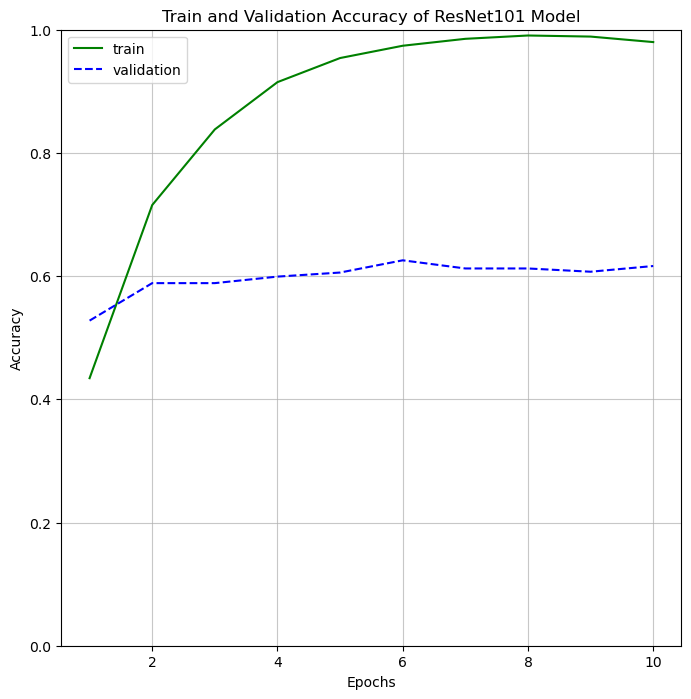

In [51]:
plot_accuracy(epoch_resnet101, result_resnet101.history, 'ResNet101')

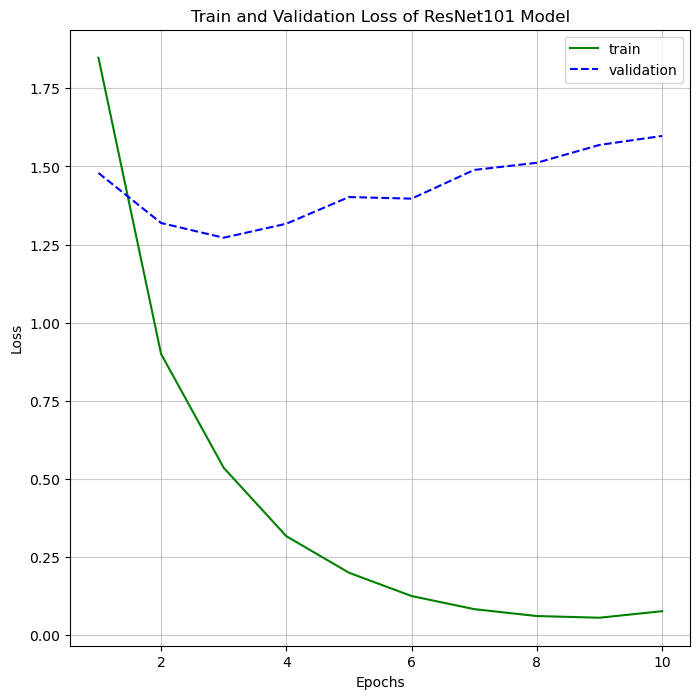

In [52]:
plot_loss(epoch_resnet101, result_resnet101.history, 'ResNet101')

1/1 [==============================] - 1s 1s/step


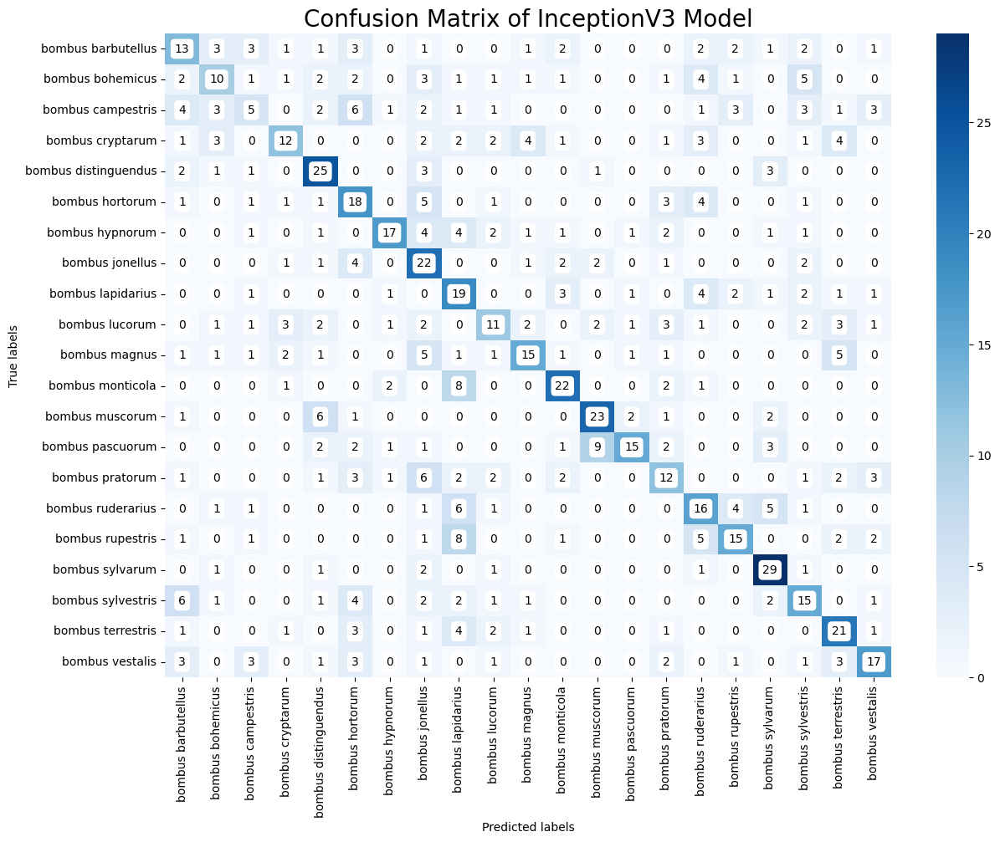

In [31]:
plot_confusion_matrix(model_resnet101, validate_batches_resnet, 'ResNet101')

1/1 [==============================] - 0s 349ms/step


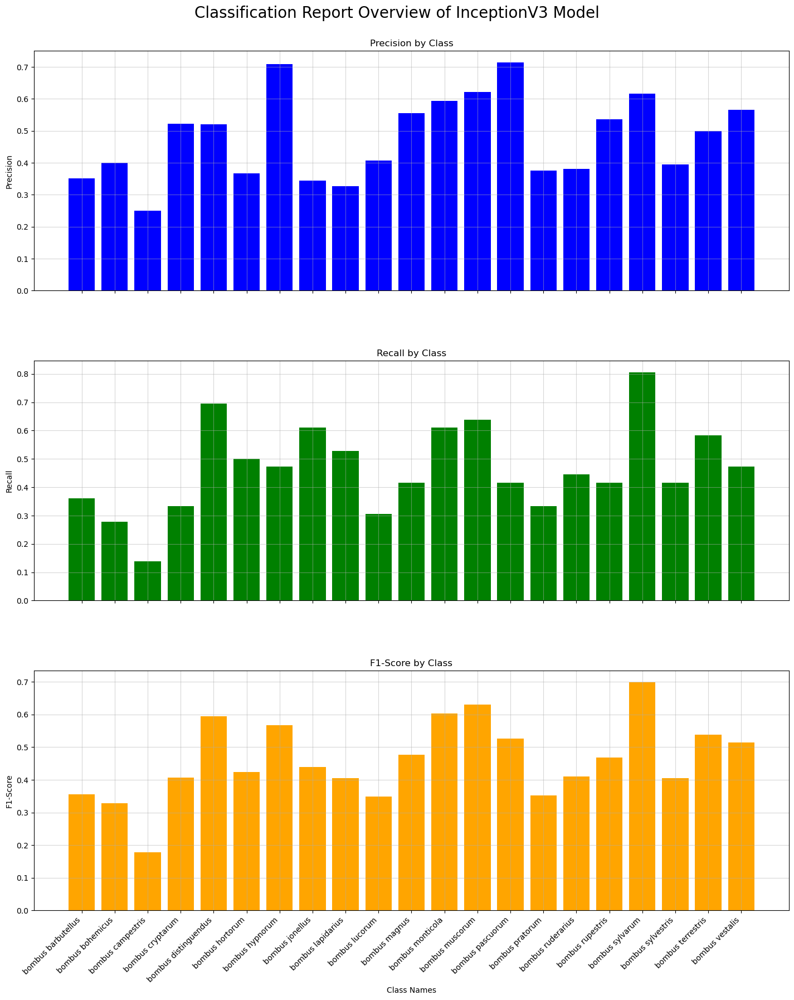

In [32]:
plot_classification_report(model_resnet101, validate_batches_resnet, 'ResNet101')

In [33]:
print_classification_report(model_resnet101, validate_batches_resnet)

1/1 [==============================] - 0s 350ms/step
Classification Report:
                       precision    recall  f1-score   support

  bombus barbutellus       0.35      0.36      0.36        36
    bombus bohemicus       0.40      0.28      0.33        36
   bombus campestris       0.25      0.14      0.18        36
    bombus cryptarum       0.52      0.33      0.41        36
bombus distinguendus       0.52      0.69      0.60        36
     bombus hortorum       0.37      0.50      0.42        36
     bombus hypnorum       0.71      0.47      0.57        36
     bombus jonellus       0.34      0.61      0.44        36
   bombus lapidarius       0.33      0.53      0.40        36
      bombus lucorum       0.41      0.31      0.35        36
       bombus magnus       0.56      0.42      0.48        36
    bombus monticola       0.59      0.61      0.60        36
     bombus muscorum       0.62      0.64      0.63        36
    bombus pascuorum       0.71      0.42      0.53   

1/1 [==============================] - 0s 365ms/step


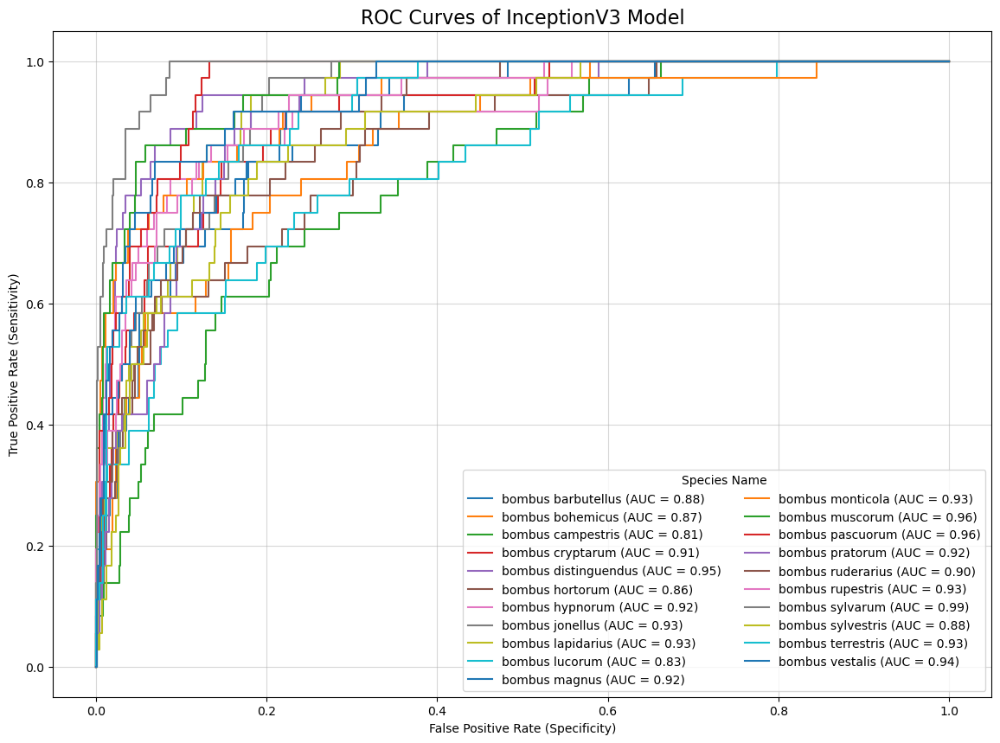

In [34]:
plot_roc_curves(model_resnet101, validate_batches_resnet, 'ResNet101')

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.3 VGG19 </h1>
<br> </br>

In [53]:
vgg_model = tf.keras.applications.vgg19
img_height_vgg, img_width_vgg = (224, 224)
train_batches, padded_train_batches, geometric_train_batches, \
vgg_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_vgg,
    img_width_vgg,
    vgg_model
)

Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.


In [54]:
print(len(vgg_train_batches))

285


In [55]:
print(vgg_train_batches.n)

9120


In [56]:
# Specify image size and batch size
img_height_vgg, img_width_vgg = (224, 224)
batch_size = 32

In [57]:
validate_batches_vgg = ImageDataGenerator(preprocessing_function=
                                          tf.keras.applications.vgg19.preprocess_input) \
                    .flow_from_directory(validate_data_dir, target_size=(img_height_vgg, img_width_vgg),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True, seed=42)

Found 756 images belonging to 21 classes.


In [58]:
print(len(train_batches))
print(len(padded_train_batches))
print(len(geometric_train_batches))

95
95
95


In [59]:
print(type(train_batches))
print(type(padded_train_batches))
print(type(geometric_train_batches))

<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

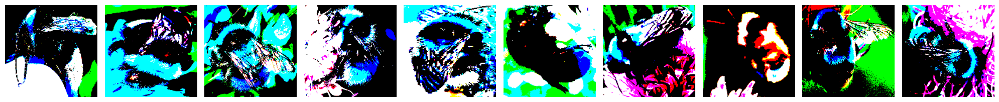

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [60]:
imgs, labels = next(train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

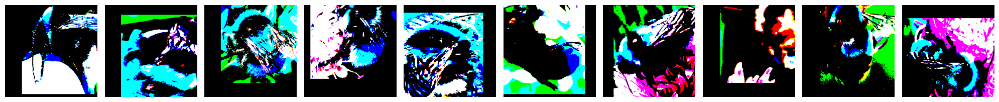

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [61]:
imgs, labels = next(padded_train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

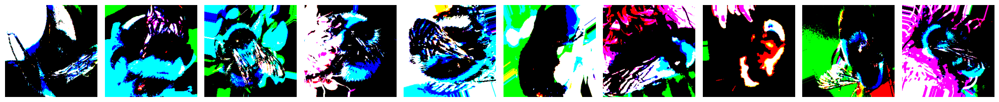

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [62]:
imgs, labels = next(geometric_train_batches)

plotImages(imgs)
print(labels)

In [63]:
vgg19 = tf.keras.applications.VGG19(
    include_top=False,
    input_shape=(224, 224, 3),
    pooling='avg',
    weights='imagenet')

for layer in vgg19.layers:
        layer.trainable=False

In [64]:
vgg19.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [65]:
model_vgg19 = Sequential()

model_vgg19.add(vgg19)
model_vgg19.add(Flatten())
model_vgg19.add(Dense(512, activation='relu'))
model_vgg19.add(Dropout(0.2))
model_vgg19.add(Dense(21, activation='softmax'))

In [66]:
model_vgg19.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 flatten_2 (Flatten)         (None, 512)               0         
                                                                 
 dense_4 (Dense)             (None, 512)               262656    
                                                                 
 dropout_2 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 21)                10773     
                                                                 
Total params: 20297813 (77.43 MB)
Trainable params: 273429 (1.04 MB)
Non-trainable params: 20024384 (76.39 MB)
_________________________________________________________________


In [67]:
model_vgg19.compile(optimizer=Adam(learning_rate=0.001),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

In [68]:
epoch_vgg19 = 10

result_vgg19 = model_vgg19.fit(vgg_train_batches,
                               validation_data=validate_batches_vgg,
                               epochs=epoch_vgg19,
                               verbose=2)

Epoch 1/10
285/285 - 571s - loss: 2.6468 - accuracy: 0.3309 - val_loss: 1.9399 - val_accuracy: 0.3757 - 571s/epoch - 2s/step
Epoch 2/10
285/285 - 572s - loss: 1.2114 - accuracy: 0.6194 - val_loss: 1.7591 - val_accuracy: 0.4537 - 572s/epoch - 2s/step
Epoch 3/10
285/285 - 572s - loss: 0.7452 - accuracy: 0.7595 - val_loss: 1.8412 - val_accuracy: 0.4762 - 572s/epoch - 2s/step
Epoch 4/10
285/285 - 571s - loss: 0.4524 - accuracy: 0.8588 - val_loss: 1.8243 - val_accuracy: 0.4802 - 571s/epoch - 2s/step
Epoch 5/10
285/285 - 571s - loss: 0.3021 - accuracy: 0.9128 - val_loss: 1.9517 - val_accuracy: 0.4921 - 571s/epoch - 2s/step
Epoch 6/10
285/285 - 569s - loss: 0.2102 - accuracy: 0.9396 - val_loss: 2.0556 - val_accuracy: 0.4828 - 569s/epoch - 2s/step
Epoch 7/10
285/285 - 571s - loss: 0.1768 - accuracy: 0.9496 - val_loss: 2.0785 - val_accuracy: 0.5132 - 571s/epoch - 2s/step
Epoch 8/10
285/285 - 571s - loss: 0.1317 - accuracy: 0.9649 - val_loss: 2.2381 - val_accuracy: 0.4762 - 571s/epoch - 2s/step


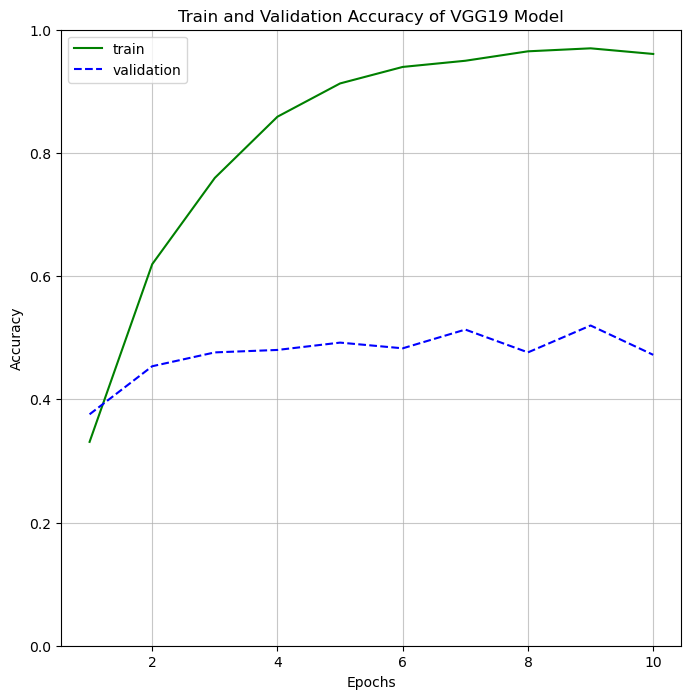

In [69]:
plot_accuracy(epoch_vgg19, result_vgg19.history, 'VGG19')

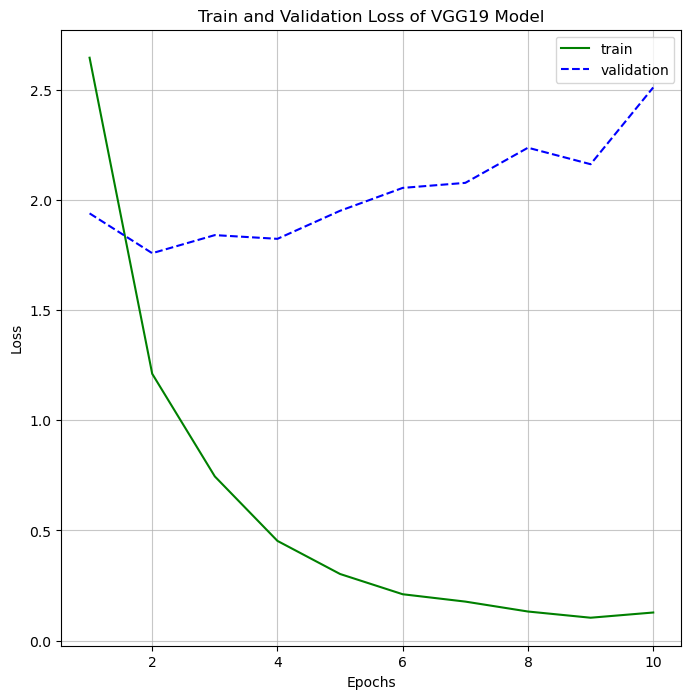

In [70]:
plot_loss(epoch_vgg19, result_vgg19.history, 'VGG19')

1/1 [==============================] - 1s 1s/step


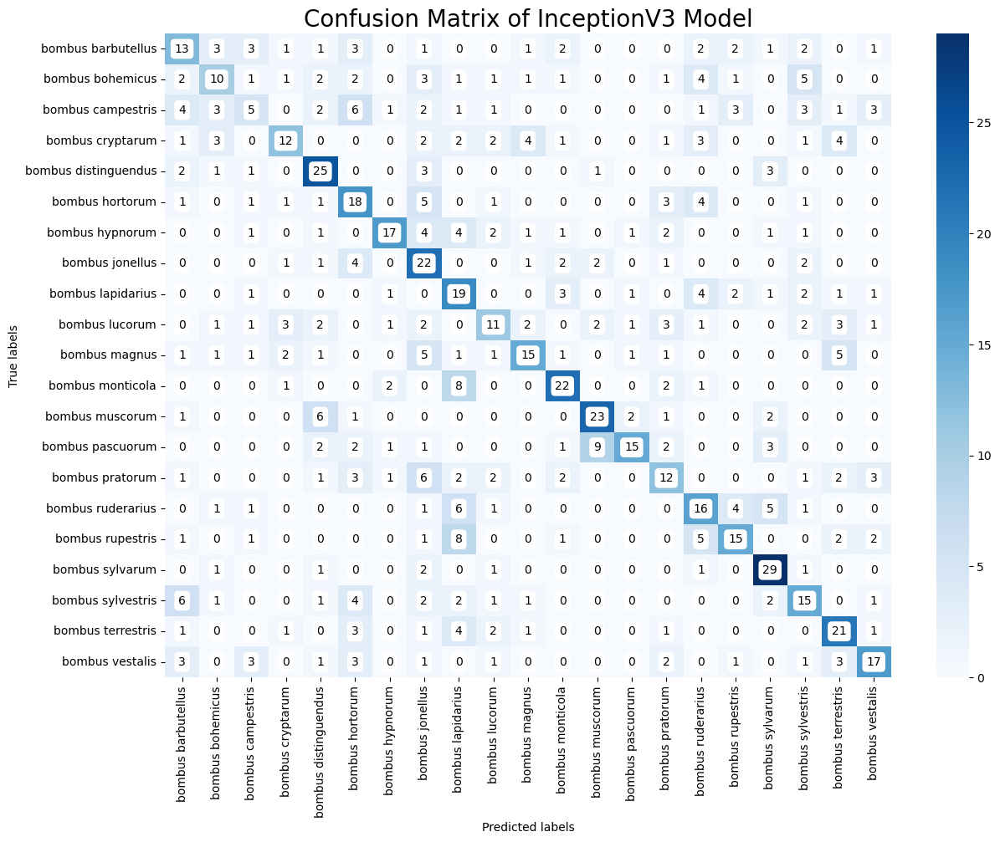

In [31]:
plot_confusion_matrix(model_vgg19, validate_batches_vgg, 'VGG19')

1/1 [==============================] - 0s 349ms/step


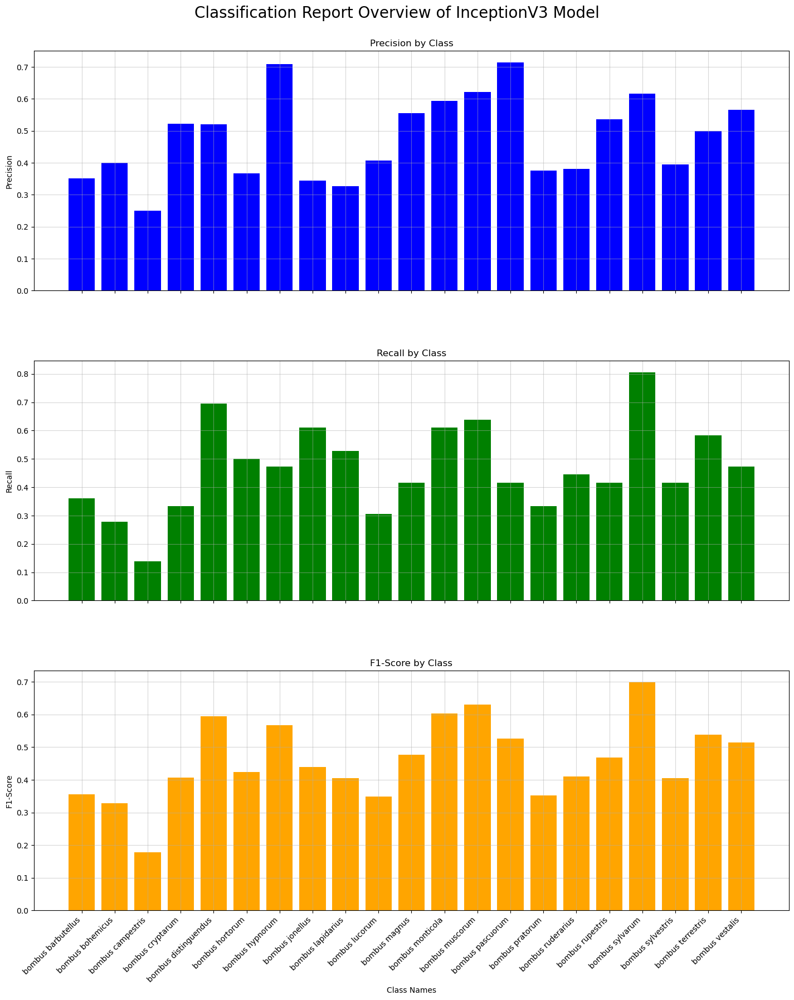

In [32]:
plot_classification_report(model_vgg19, validate_batches_vgg, 'VGG19')

In [33]:
print_classification_report(model_vgg19, validate_batches_vgg)

1/1 [==============================] - 0s 350ms/step
Classification Report:
                       precision    recall  f1-score   support

  bombus barbutellus       0.35      0.36      0.36        36
    bombus bohemicus       0.40      0.28      0.33        36
   bombus campestris       0.25      0.14      0.18        36
    bombus cryptarum       0.52      0.33      0.41        36
bombus distinguendus       0.52      0.69      0.60        36
     bombus hortorum       0.37      0.50      0.42        36
     bombus hypnorum       0.71      0.47      0.57        36
     bombus jonellus       0.34      0.61      0.44        36
   bombus lapidarius       0.33      0.53      0.40        36
      bombus lucorum       0.41      0.31      0.35        36
       bombus magnus       0.56      0.42      0.48        36
    bombus monticola       0.59      0.61      0.60        36
     bombus muscorum       0.62      0.64      0.63        36
    bombus pascuorum       0.71      0.42      0.53   

1/1 [==============================] - 0s 365ms/step


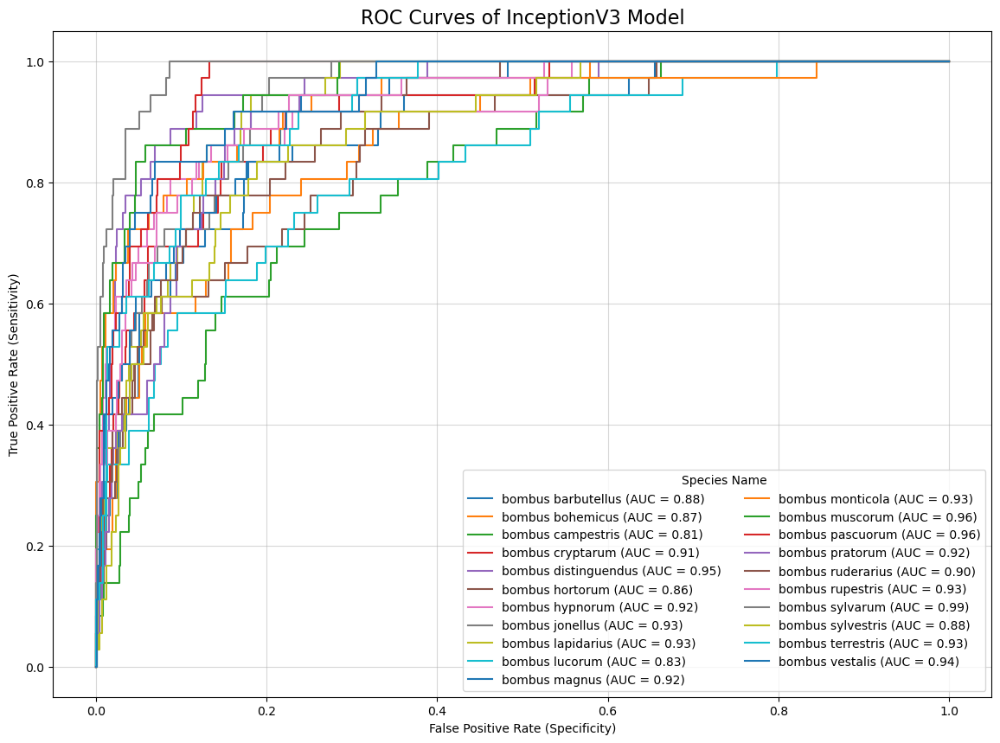

In [34]:
plot_roc_curves(model_vgg19, validate_batches_vgg, 'VGG19')

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.4 MobileNetV3Large </h1>
<br> </br>

In [71]:
mobilenet_model = tf.keras.applications.mobilenet_v3
img_height_mobilenet, img_width_mobilenet = (224, 224)
train_batches, padded_train_batches, geometric_train_batches, \
mobilenet_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_mobilenet,
    img_width_mobilenet,
    mobilenet_model
)

Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.


In [72]:
print(len(mobilenet_train_batches))

285


In [73]:
print(mobilenet_train_batches.n)

9120


In [74]:
# Specify image size and batch size
img_height_mobilenet, img_width_mobilenet = (224, 224)
batch_size = 32

In [75]:
validate_batches_mobilenet = ImageDataGenerator(preprocessing_function=
                             tf.keras.applications.mobilenet_v3.preprocess_input) \
                    .flow_from_directory(validate_data_dir, 
                                         target_size=(img_height_mobilenet, img_width_mobilenet),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True, seed=42)

Found 756 images belonging to 21 classes.


In [76]:
print(len(train_batches))
print(len(padded_train_batches))
print(len(geometric_train_batches))

95
95
95


In [77]:
print(type(train_batches))
print(type(padded_train_batches))
print(type(geometric_train_batches))

<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

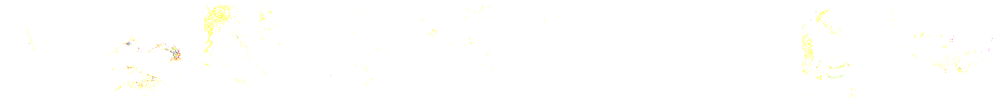

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [78]:
imgs, labels = next(train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

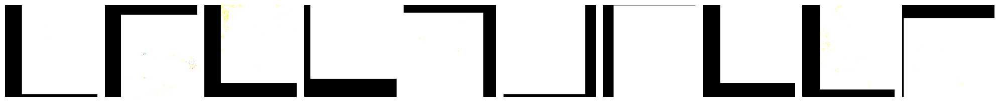

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [79]:
imgs, labels = next(padded_train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

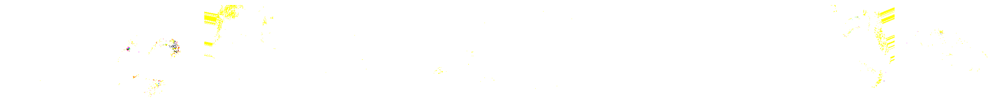

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [80]:
imgs, labels = next(geometric_train_batches)

plotImages(imgs)
print(labels)

In [81]:
mobilenetv3 = tf.keras.applications.MobileNetV3Large(
    include_top=False,
    input_shape=(224, 224, 3),
    pooling='avg',
    weights='imagenet')

for layer in mobilenetv3.layers:
        layer.trainable=False

In [82]:
mobilenetv3.summary()

Model: "MobilenetV3large"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_4[0][0]']             
                                                                                                  
 Conv (Conv2D)               (None, 112, 112, 16)         432       ['rescaling[0][0]']           
                                                                                                  
 Conv/BatchNorm (BatchNorma  (None, 112, 112, 16)         64        ['Conv[0][0]']                
 lization)                                                                         

 expanded_conv_2/depthwise   (None, 56, 56, 72)           648       ['re_lu_4[0][0]']             
 (DepthwiseConv2D)                                                                                
                                                                                                  
 expanded_conv_2/depthwise/  (None, 56, 56, 72)           288       ['expanded_conv_2/depthwise[0]
 BatchNorm (BatchNormalizat                                         [0]']                         
 ion)                                                                                             
                                                                                                  
 re_lu_5 (ReLU)              (None, 56, 56, 72)           0         ['expanded_conv_2/depthwise/Ba
                                                                    tchNorm[0][0]']               
                                                                                                  
 expanded_

                                                                                                  
 re_lu_9 (ReLU)              (None, 28, 28, 120)          0         ['expanded_conv_4/expand/Batch
                                                                    Norm[0][0]']                  
                                                                                                  
 expanded_conv_4/depthwise   (None, 28, 28, 120)          3000      ['re_lu_9[0][0]']             
 (DepthwiseConv2D)                                                                                
                                                                                                  
 expanded_conv_4/depthwise/  (None, 28, 28, 120)          480       ['expanded_conv_4/depthwise[0]
 BatchNorm (BatchNormalizat                                         [0]']                         
 ion)                                                                                             
          

                                                                                                  
 tf.__operators__.add_3 (TF  (None, 1, 1, 120)            0         ['expanded_conv_5/squeeze_exci
 OpLambda)                                                          te/Conv_1[0][0]']             
                                                                                                  
 re_lu_14 (ReLU)             (None, 1, 1, 120)            0         ['tf.__operators__.add_3[0][0]
                                                                    ']                            
                                                                                                  
 tf.math.multiply_3 (TFOpLa  (None, 1, 1, 120)            0         ['re_lu_14[0][0]']            
 mbda)                                                                                            
                                                                                                  
 expanded_

                                                                                                  
 re_lu_17 (ReLU)             (None, 14, 14, 200)          0         ['tf.__operators__.add_6[0][0]
                                                                    ']                            
                                                                                                  
 tf.math.multiply_6 (TFOpLa  (None, 14, 14, 200)          0         ['re_lu_17[0][0]']            
 mbda)                                                                                            
                                                                                                  
 multiply_3 (Multiply)       (None, 14, 14, 200)          0         ['expanded_conv_7/expand/Batch
                                                                    Norm[0][0]',                  
                                                                     'tf.math.multiply_6[0][0]']  
          

 expanded_conv_8/project (C  (None, 14, 14, 80)           14720     ['multiply_6[0][0]']          
 onv2D)                                                                                           
                                                                                                  
 expanded_conv_8/project/Ba  (None, 14, 14, 80)           320       ['expanded_conv_8/project[0][0
 tchNorm (BatchNormalizatio                                         ]']                           
 n)                                                                                               
                                                                                                  
 expanded_conv_8/Add (Add)   (None, 14, 14, 80)           0         ['expanded_conv_7/Add[0][0]', 
                                                                     'expanded_conv_8/project/Batc
                                                                    hNorm[0][0]']                 
          

  (DepthwiseConv2D)                                                                               
                                                                                                  
 expanded_conv_10/depthwise  (None, 14, 14, 480)          1920      ['expanded_conv_10/depthwise[0
 /BatchNorm (BatchNormaliza                                         ][0]']                        
 tion)                                                                                            
                                                                                                  
 tf.__operators__.add_13 (T  (None, 14, 14, 480)          0         ['expanded_conv_10/depthwise/B
 FOpLambda)                                                         atchNorm[0][0]']              
                                                                                                  
 re_lu_24 (ReLU)             (None, 14, 14, 480)          0         ['tf.__operators__.add_13[0][0
          

                                                                                                  
 tf.math.multiply_16 (TFOpL  (None, 14, 14, 672)          0         ['re_lu_27[0][0]']            
 ambda)                                                                                           
                                                                                                  
 multiply_12 (Multiply)      (None, 14, 14, 672)          0         ['expanded_conv_11/depthwise/B
                                                                    atchNorm[0][0]',              
                                                                     'tf.math.multiply_16[0][0]'] 
                                                                                                  
 expanded_conv_11/squeeze_e  (None, 1, 1, 672)            0         ['multiply_12[0][0]']         
 xcite/AvgPool (GlobalAvera                                                                       
 gePooling

                                                                                                  
 multiply_14 (Multiply)      (None, 7, 7, 672)            0         ['expanded_conv_12/depthwise/B
                                                                    atchNorm[0][0]',              
                                                                     'tf.math.multiply_19[0][0]'] 
                                                                                                  
 expanded_conv_12/squeeze_e  (None, 1, 1, 672)            0         ['multiply_14[0][0]']         
 xcite/AvgPool (GlobalAvera                                                                       
 gePooling2D)                                                                                     
                                                                                                  
 expanded_conv_12/squeeze_e  (None, 1, 1, 168)            113064    ['expanded_conv_12/squeeze_exc
 xcite/Con

                                                                                                  
 expanded_conv_13/squeeze_e  (None, 1, 1, 240)            0         ['expanded_conv_13/squeeze_exc
 xcite/Relu (ReLU)                                                  ite/Conv[0][0]']              
                                                                                                  
 expanded_conv_13/squeeze_e  (None, 1, 1, 960)            231360    ['expanded_conv_13/squeeze_exc
 xcite/Conv_1 (Conv2D)                                              ite/Relu[0][0]']              
                                                                                                  
 tf.__operators__.add_23 (T  (None, 1, 1, 960)            0         ['expanded_conv_13/squeeze_exc
 FOpLambda)                                                         ite/Conv_1[0][0]']            
                                                                                                  
 re_lu_34 

                                                                                                  
 tf.__operators__.add_26 (T  (None, 1, 1, 960)            0         ['expanded_conv_14/squeeze_exc
 FOpLambda)                                                         ite/Conv_1[0][0]']            
                                                                                                  
 re_lu_37 (ReLU)             (None, 1, 1, 960)            0         ['tf.__operators__.add_26[0][0
                                                                    ]']                           
                                                                                                  
 tf.math.multiply_26 (TFOpL  (None, 1, 1, 960)            0         ['re_lu_37[0][0]']            
 ambda)                                                                                           
                                                                                                  
 expanded_

In [83]:
model_mobilenetv3 = Sequential()

model_mobilenetv3.add(mobilenetv3)
model_mobilenetv3.add(Flatten())
model_mobilenetv3.add(Dense(512, activation='relu'))
model_mobilenetv3.add(Dropout(0.2))
model_mobilenetv3.add(Dense(21, activation='softmax'))

In [84]:
model_mobilenetv3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 MobilenetV3large (Function  (None, 960)               2996352   
 al)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 960)               0         
                                                                 
 dense_6 (Dense)             (None, 512)               492032    
                                                                 
 dropout_3 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 21)                10773     
                                                                 
Total params: 3499157 (13.35 MB)
Trainable params: 502805 (1.92 MB)
Non-trainable params: 2996352 (11.43 MB)
___________

In [85]:
model_mobilenetv3.compile(optimizer=Adam(learning_rate=0.001),
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

In [86]:
epoch_mobilenetv3 = 10

result_mobilenetv3 = model_mobilenetv3.fit(mobilenet_train_batches,
                                           validation_data=validate_batches_mobilenet,
                                           epochs=epoch_mobilenetv3,
                                           verbose=2)

Epoch 1/10
285/285 - 47s - loss: 1.7982 - accuracy: 0.4540 - val_loss: 1.4957 - val_accuracy: 0.4987 - 47s/epoch - 167ms/step
Epoch 2/10
285/285 - 45s - loss: 0.8673 - accuracy: 0.7330 - val_loss: 1.2911 - val_accuracy: 0.5979 - 45s/epoch - 158ms/step
Epoch 3/10
285/285 - 47s - loss: 0.5031 - accuracy: 0.8556 - val_loss: 1.2997 - val_accuracy: 0.5979 - 47s/epoch - 164ms/step
Epoch 4/10
285/285 - 46s - loss: 0.3067 - accuracy: 0.9170 - val_loss: 1.1889 - val_accuracy: 0.6336 - 46s/epoch - 163ms/step
Epoch 5/10
285/285 - 46s - loss: 0.1810 - accuracy: 0.9620 - val_loss: 1.2001 - val_accuracy: 0.6614 - 46s/epoch - 160ms/step
Epoch 6/10
285/285 - 47s - loss: 0.1035 - accuracy: 0.9839 - val_loss: 1.3009 - val_accuracy: 0.6415 - 47s/epoch - 163ms/step
Epoch 7/10
285/285 - 46s - loss: 0.0684 - accuracy: 0.9910 - val_loss: 1.2583 - val_accuracy: 0.6481 - 46s/epoch - 163ms/step
Epoch 8/10
285/285 - 45s - loss: 0.0566 - accuracy: 0.9918 - val_loss: 1.4867 - val_accuracy: 0.6058 - 45s/epoch - 158

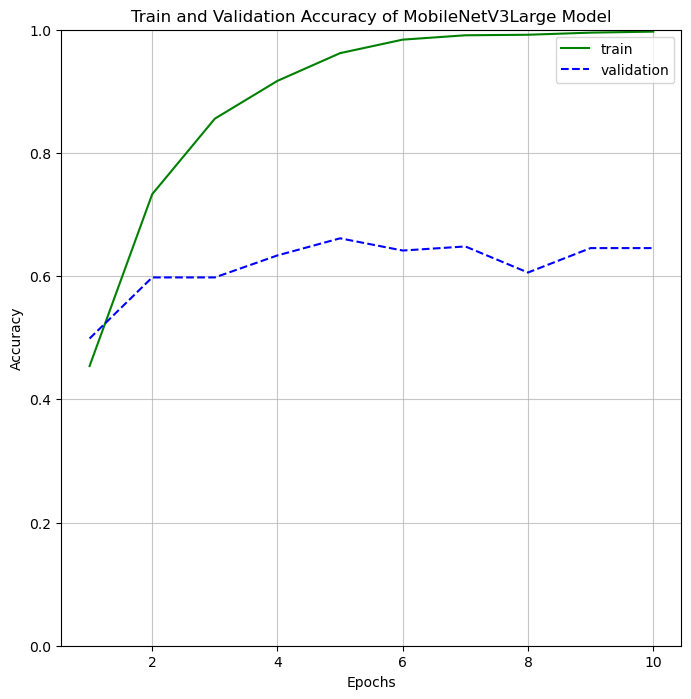

In [87]:
plot_accuracy(epoch_mobilenetv3, result_mobilenetv3.history, 'MobileNetV3Large')

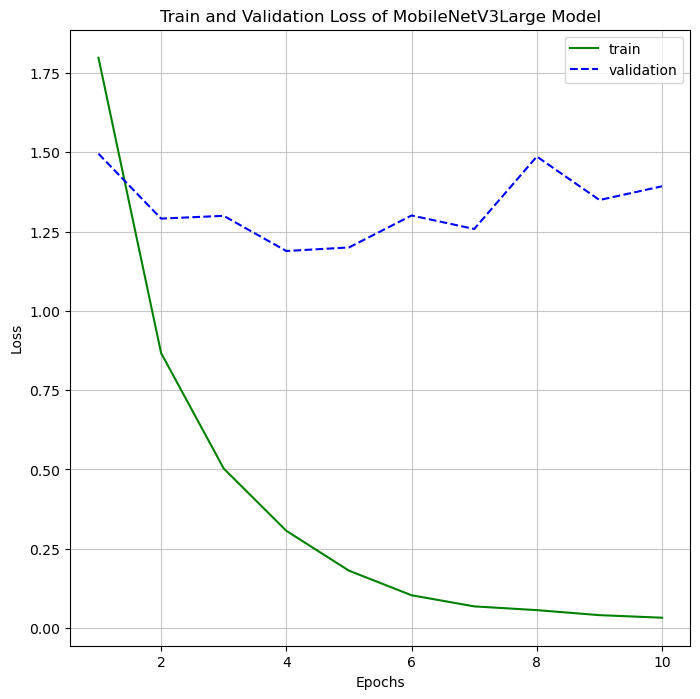

In [88]:
plot_loss(epoch_mobilenetv3, result_mobilenetv3.history, 'MobileNetV3Large')

1/1 [==============================] - 1s 1s/step


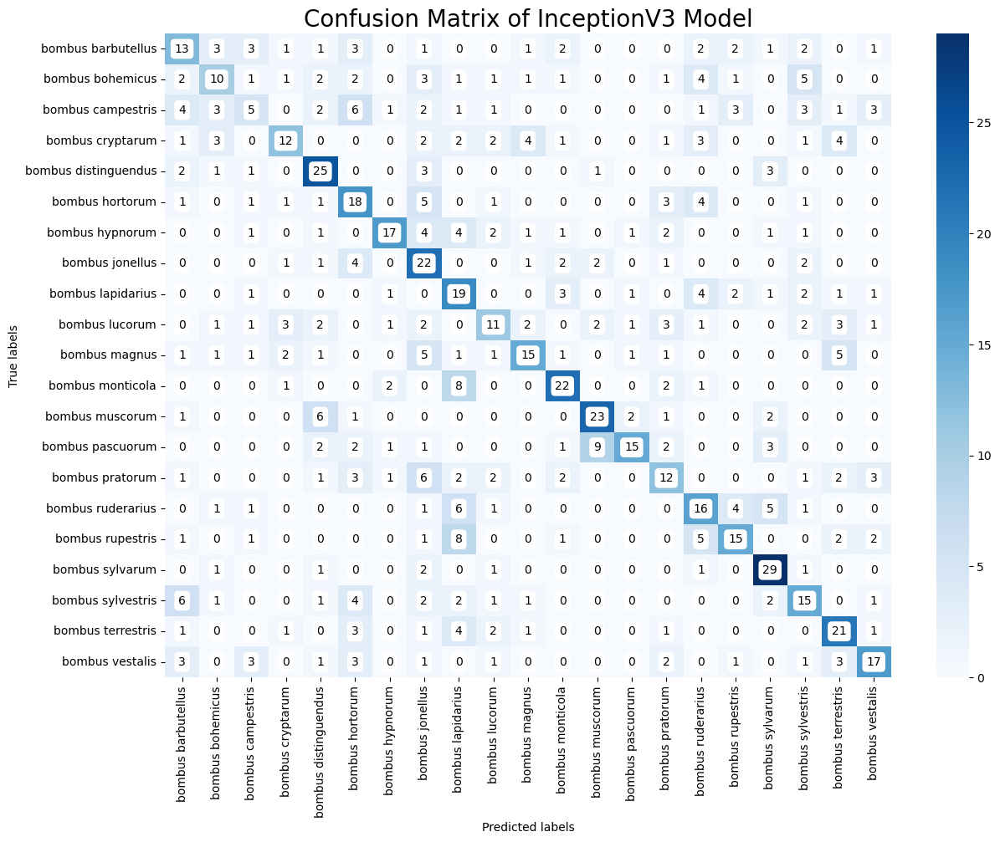

In [31]:
plot_confusion_matrix(model_mobilenetv3, validate_batches_mobilenet, 'MobileNetV3')

1/1 [==============================] - 0s 349ms/step


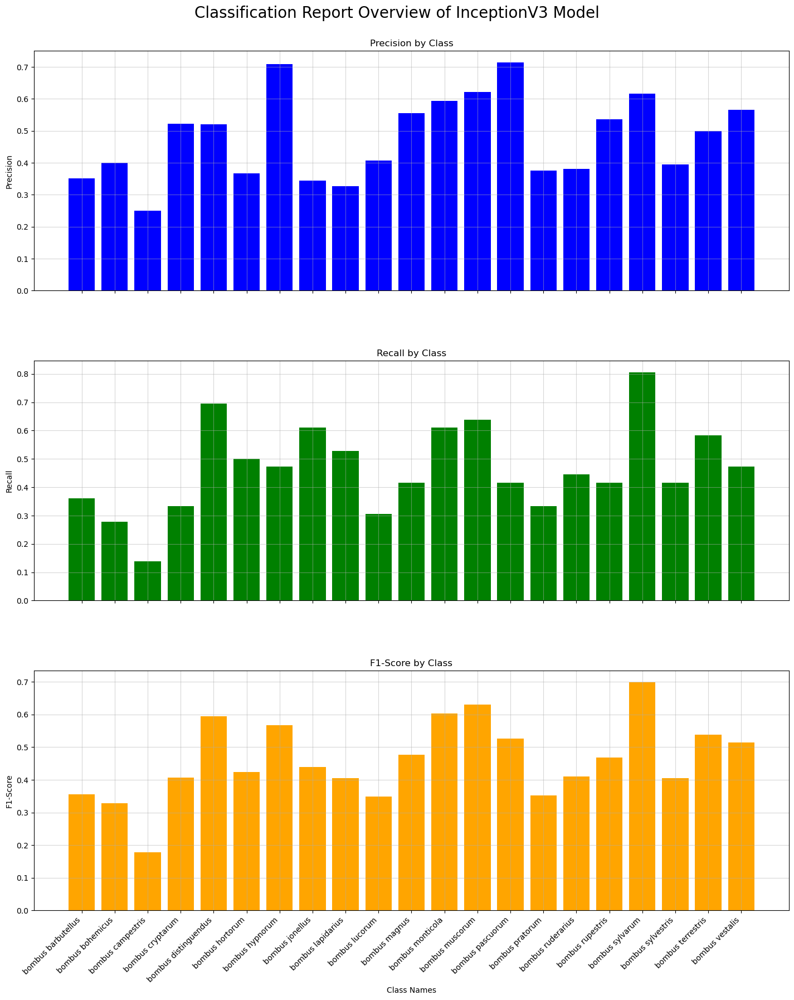

In [32]:
plot_classification_report(model_mobilenetv3, validate_batches_mobilenet, 'MobileNetV3')

In [33]:
print_classification_report(model_mobilenetv3, validate_batches_mobilenet)

1/1 [==============================] - 0s 350ms/step
Classification Report:
                       precision    recall  f1-score   support

  bombus barbutellus       0.35      0.36      0.36        36
    bombus bohemicus       0.40      0.28      0.33        36
   bombus campestris       0.25      0.14      0.18        36
    bombus cryptarum       0.52      0.33      0.41        36
bombus distinguendus       0.52      0.69      0.60        36
     bombus hortorum       0.37      0.50      0.42        36
     bombus hypnorum       0.71      0.47      0.57        36
     bombus jonellus       0.34      0.61      0.44        36
   bombus lapidarius       0.33      0.53      0.40        36
      bombus lucorum       0.41      0.31      0.35        36
       bombus magnus       0.56      0.42      0.48        36
    bombus monticola       0.59      0.61      0.60        36
     bombus muscorum       0.62      0.64      0.63        36
    bombus pascuorum       0.71      0.42      0.53   

1/1 [==============================] - 0s 365ms/step


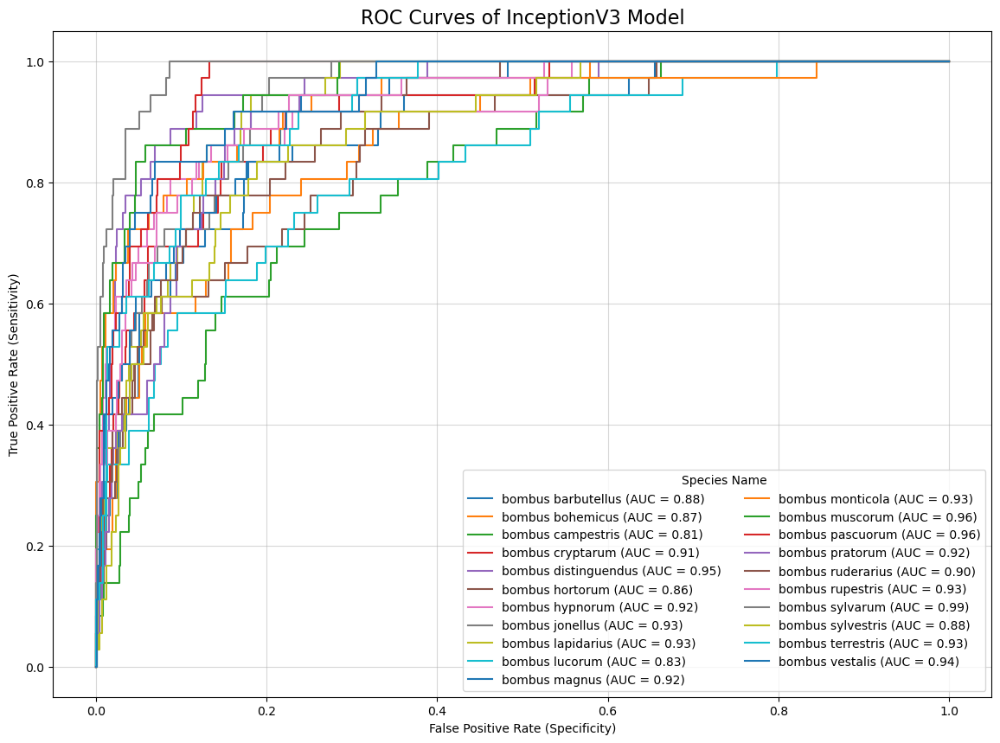

In [34]:
plot_roc_curves(model_mobilenetv3, validate_batches_mobilenet, 'MobileNetV3')

<br> </br>
<h1 style="font-size: 28px; text-align: center; color: purple"> 2.5 EfficientNetV2 Large </h1>
<br> </br>

In [89]:
efficientnet_model = tf.keras.applications.efficientnet_v2
img_height_efficientnet, img_width_efficientnet = (240, 240)
train_batches, padded_train_batches, geometric_train_batches, \
efficientnet_train_batches = create_augmented_train_batches_keras(
    training_data_dir,
    img_height_efficientnet,
    img_width_efficientnet,
    efficientnet_model
)

Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.
Found 3024 images belonging to 21 classes.


In [90]:
print(len(efficientnet_train_batches))

285


In [91]:
print(efficientnet_train_batches.n)

9120


In [92]:
# Specify image size and batch size
img_height_efficientnet, img_width_efficientnet = (240, 240)
batch_size = 32

In [93]:
validate_batches_efficientnet = ImageDataGenerator(preprocessing_function=
                                tf.keras.applications.efficientnet_v2.preprocess_input) \
                    .flow_from_directory(validate_data_dir, 
                                         target_size=(img_height_efficientnet, img_width_efficientnet),
                                         batch_size=batch_size, class_mode='categorical', 
                                         shuffle=True, seed=42)

Found 756 images belonging to 21 classes.


In [94]:
print(len(train_batches))
print(len(padded_train_batches))
print(len(geometric_train_batches))

95
95
95


In [95]:
print(type(train_batches))
print(type(padded_train_batches))
print(type(geometric_train_batches))

<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>
<class 'keras.src.preprocessing.image.DirectoryIterator'>


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

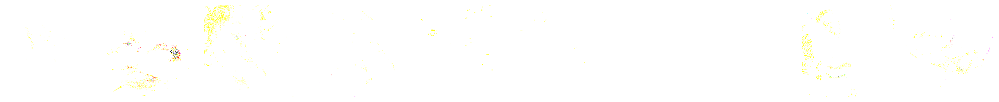

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [96]:
imgs, labels = next(train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

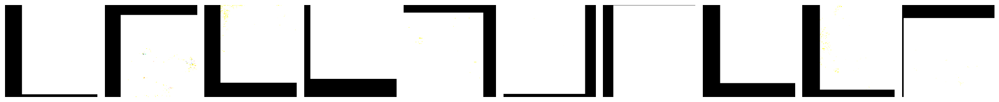

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [97]:
imgs, labels = next(padded_train_batches)

plotImages(imgs)
print(labels)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

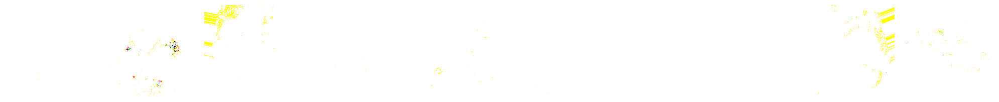

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [98]:
imgs, labels = next(geometric_train_batches)

plotImages(imgs)
print(labels)

In [99]:
efficientnetv2 = tf.keras.applications.EfficientNetV2L(
    include_top=False,
    input_shape=(480, 480, 3),
    pooling='avg',
    weights='imagenet')

for layer in efficientnetv2.layers:
        layer.trainable=False

In [100]:
efficientnetv2.summary()

Model: "efficientnetv2-l"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 480, 480, 3)]        0         []                            
                                                                                                  
 rescaling_1 (Rescaling)     (None, 480, 480, 3)          0         ['input_5[0][0]']             
                                                                                                  
 stem_conv (Conv2D)          (None, 240, 240, 32)         864       ['rescaling_1[0][0]']         
                                                                                                  
 stem_bn (BatchNormalizatio  (None, 240, 240, 32)         128       ['stem_conv[0][0]']           
 n)                                                                                

 2D)                                                                [0]']                         
                                                                                                  
 block2a_project_bn (BatchN  (None, 120, 120, 64)         256       ['block2a_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block2b_expand_conv (Conv2  (None, 120, 120, 256)        147456    ['block2a_project_bn[0][0]']  
 D)                                                                                               
                                                                                                  
 block2b_expand_bn (BatchNo  (None, 120, 120, 256)        1024      ['block2b_expand_conv[0][0]'] 
 rmalization)                                                                                     
          

                                                                     'block2d_add[0][0]']         
                                                                                                  
 block2f_expand_conv (Conv2  (None, 120, 120, 256)        147456    ['block2e_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block2f_expand_bn (BatchNo  (None, 120, 120, 256)        1024      ['block2f_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block2f_expand_activation   (None, 120, 120, 256)        0         ['block2f_expand_bn[0][0]']   
 (Activation)                                                                                     
          

 block3c_expand_activation   (None, 60, 60, 384)          0         ['block3c_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block3c_project_conv (Conv  (None, 60, 60, 96)           36864     ['block3c_expand_activation[0]
 2D)                                                                [0]']                         
                                                                                                  
 block3c_project_bn (BatchN  (None, 60, 60, 96)           384       ['block3c_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block3c_drop (Dropout)      (None, 60, 60, 96)           0         ['block3c_project_bn[0][0]']  
          

 block3g_project_conv (Conv  (None, 60, 60, 96)           36864     ['block3g_expand_activation[0]
 2D)                                                                [0]']                         
                                                                                                  
 block3g_project_bn (BatchN  (None, 60, 60, 96)           384       ['block3g_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block3g_drop (Dropout)      (None, 60, 60, 96)           0         ['block3g_project_bn[0][0]']  
                                                                                                  
 block3g_add (Add)           (None, 60, 60, 96)           0         ['block3g_drop[0][0]',        
                                                                     'block3f_add[0][0]']         
          

 ormalization)                                                                                    
                                                                                                  
 block4b_drop (Dropout)      (None, 30, 30, 192)          0         ['block4b_project_bn[0][0]']  
                                                                                                  
 block4b_add (Add)           (None, 30, 30, 192)          0         ['block4b_drop[0][0]',        
                                                                     'block4a_project_bn[0][0]']  
                                                                                                  
 block4c_expand_conv (Conv2  (None, 30, 30, 768)          147456    ['block4b_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block4c_e

 block4d_project_bn (BatchN  (None, 30, 30, 192)          768       ['block4d_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block4d_drop (Dropout)      (None, 30, 30, 192)          0         ['block4d_project_bn[0][0]']  
                                                                                                  
 block4d_add (Add)           (None, 30, 30, 192)          0         ['block4d_drop[0][0]',        
                                                                     'block4c_add[0][0]']         
                                                                                                  
 block4e_expand_conv (Conv2  (None, 30, 30, 768)          147456    ['block4d_add[0][0]']         
 D)                                                                                               
          

                                                                                                  
 block4f_project_bn (BatchN  (None, 30, 30, 192)          768       ['block4f_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block4f_drop (Dropout)      (None, 30, 30, 192)          0         ['block4f_project_bn[0][0]']  
                                                                                                  
 block4f_add (Add)           (None, 30, 30, 192)          0         ['block4f_drop[0][0]',        
                                                                     'block4e_add[0][0]']         
                                                                                                  
 block4g_expand_conv (Conv2  (None, 30, 30, 768)          147456    ['block4f_add[0][0]']         
 D)       

 2D)                                                                                              
                                                                                                  
 block4h_project_bn (BatchN  (None, 30, 30, 192)          768       ['block4h_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block4h_drop (Dropout)      (None, 30, 30, 192)          0         ['block4h_project_bn[0][0]']  
                                                                                                  
 block4h_add (Add)           (None, 30, 30, 192)          0         ['block4h_drop[0][0]',        
                                                                     'block4g_add[0][0]']         
                                                                                                  
 block4i_e

 block4j_project_conv (Conv  (None, 30, 30, 192)          147456    ['block4j_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block4j_project_bn (BatchN  (None, 30, 30, 192)          768       ['block4j_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block4j_drop (Dropout)      (None, 30, 30, 192)          0         ['block4j_project_bn[0][0]']  
                                                                                                  
 block4j_add (Add)           (None, 30, 30, 192)          0         ['block4j_drop[0][0]',        
                                                                     'block4i_add[0][0]']         
          

 ormalization)                                                                                    
                                                                                                  
 block5b_drop (Dropout)      (None, 30, 30, 224)          0         ['block5b_project_bn[0][0]']  
                                                                                                  
 block5b_add (Add)           (None, 30, 30, 224)          0         ['block5b_drop[0][0]',        
                                                                     'block5a_project_bn[0][0]']  
                                                                                                  
 block5c_expand_conv (Conv2  (None, 30, 30, 1344)         301056    ['block5b_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block5c_e

 block5d_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5d_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5d_drop (Dropout)      (None, 30, 30, 224)          0         ['block5d_project_bn[0][0]']  
                                                                                                  
 block5d_add (Add)           (None, 30, 30, 224)          0         ['block5d_drop[0][0]',        
                                                                     'block5c_add[0][0]']         
                                                                                                  
 block5e_expand_conv (Conv2  (None, 30, 30, 1344)         301056    ['block5d_add[0][0]']         
 D)                                                                                               
          

                                                                                                  
 block5f_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5f_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5f_drop (Dropout)      (None, 30, 30, 224)          0         ['block5f_project_bn[0][0]']  
                                                                                                  
 block5f_add (Add)           (None, 30, 30, 224)          0         ['block5f_drop[0][0]',        
                                                                     'block5e_add[0][0]']         
                                                                                                  
 block5g_expand_conv (Conv2  (None, 30, 30, 1344)         301056    ['block5f_add[0][0]']         
 D)       

 2D)                                                                                              
                                                                                                  
 block5h_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5h_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5h_drop (Dropout)      (None, 30, 30, 224)          0         ['block5h_project_bn[0][0]']  
                                                                                                  
 block5h_add (Add)           (None, 30, 30, 224)          0         ['block5h_drop[0][0]',        
                                                                     'block5g_add[0][0]']         
                                                                                                  
 block5i_e

 block5j_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5j_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5j_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5j_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5j_drop (Dropout)      (None, 30, 30, 224)          0         ['block5j_project_bn[0][0]']  
                                                                                                  
 block5j_add (Add)           (None, 30, 30, 224)          0         ['block5j_drop[0][0]',        
                                                                     'block5i_add[0][0]']         
          

                                                                                                  
 block5l_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5l_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5l_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5l_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5l_drop (Dropout)      (None, 30, 30, 224)          0         ['block5l_project_bn[0][0]']  
                                                                                                  
 block5l_add (Add)           (None, 30, 30, 224)          0         ['block5l_drop[0][0]',        
          

 y)                                                                  'block5n_se_expand[0][0]']   
                                                                                                  
 block5n_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5n_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5n_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5n_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5n_drop (Dropout)      (None, 30, 30, 224)          0         ['block5n_project_bn[0][0]']  
                                                                                                  
 block5n_a

 block5p_se_excite (Multipl  (None, 30, 30, 1344)         0         ['block5p_activation[0][0]',  
 y)                                                                  'block5p_se_expand[0][0]']   
                                                                                                  
 block5p_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5p_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5p_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5p_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5p_drop (Dropout)      (None, 30, 30, 224)          0         ['block5p_project_bn[0][0]']  
          

                                                                                                  
 block5r_se_excite (Multipl  (None, 30, 30, 1344)         0         ['block5r_activation[0][0]',  
 y)                                                                  'block5r_se_expand[0][0]']   
                                                                                                  
 block5r_project_conv (Conv  (None, 30, 30, 224)          301056    ['block5r_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block5r_project_bn (BatchN  (None, 30, 30, 224)          896       ['block5r_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block5r_d

 block6a_se_expand (Conv2D)  (None, 1, 1, 1344)           76608     ['block6a_se_reduce[0][0]']   
                                                                                                  
 block6a_se_excite (Multipl  (None, 15, 15, 1344)         0         ['block6a_activation[0][0]',  
 y)                                                                  'block6a_se_expand[0][0]']   
                                                                                                  
 block6a_project_conv (Conv  (None, 15, 15, 384)          516096    ['block6a_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6a_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6a_project_conv[0][0]']
 ormalization)                                                                                    
          

                                                                                                  
 block6c_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6c_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6c_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6c_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block6c_drop (Dropout)      (None, 15, 15, 384)          0         ['block6c_project_bn[0][0]']  
                                                                                                  
 block6c_add (Add)           (None, 15, 15, 384)          0         ['block6c_drop[0][0]',        
          

 y)                                                                  'block6e_se_expand[0][0]']   
                                                                                                  
 block6e_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6e_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6e_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6e_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block6e_drop (Dropout)      (None, 15, 15, 384)          0         ['block6e_project_bn[0][0]']  
                                                                                                  
 block6e_a

 block6g_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6g_activation[0][0]',  
 y)                                                                  'block6g_se_expand[0][0]']   
                                                                                                  
 block6g_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6g_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6g_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6g_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block6g_drop (Dropout)      (None, 15, 15, 384)          0         ['block6g_project_bn[0][0]']  
          

                                                                                                  
 block6i_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6i_activation[0][0]',  
 y)                                                                  'block6i_se_expand[0][0]']   
                                                                                                  
 block6i_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6i_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6i_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6i_project_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 block6i_d

 block6k_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6k_se_reduce[0][0]']   
                                                                                                  
 block6k_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6k_activation[0][0]',  
 y)                                                                  'block6k_se_expand[0][0]']   
                                                                                                  
 block6k_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6k_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6k_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6k_project_conv[0][0]']
 ormalization)                                                                                    
          

                                                                                                  
 block6m_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6m_se_reduce[0][0]']   
                                                                                                  
 block6m_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6m_activation[0][0]',  
 y)                                                                  'block6m_se_expand[0][0]']   
                                                                                                  
 block6m_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6m_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6m_project_bn (BatchN  (None, 15, 15, 384)          1536      ['block6m_project_conv[0][0]']
 ormalizat

 block6o_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6o_se_reshape[0][0]']  
                                                                                                  
 block6o_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6o_se_reduce[0][0]']   
                                                                                                  
 block6o_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6o_activation[0][0]',  
 y)                                                                  'block6o_se_expand[0][0]']   
                                                                                                  
 block6o_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6o_se_excite[0][0]']   
 2D)                                                                                              
                                                                                                  
 block6o_p

                                                                                                  
 block6q_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6q_se_reshape[0][0]']  
                                                                                                  
 block6q_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6q_se_reduce[0][0]']   
                                                                                                  
 block6q_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6q_activation[0][0]',  
 y)                                                                  'block6q_se_expand[0][0]']   
                                                                                                  
 block6q_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6q_se_excite[0][0]']   
 2D)                                                                                              
          

 e)                                                                                               
                                                                                                  
 block6s_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6s_se_reshape[0][0]']  
                                                                                                  
 block6s_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6s_se_reduce[0][0]']   
                                                                                                  
 block6s_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6s_activation[0][0]',  
 y)                                                                  'block6s_se_expand[0][0]']   
                                                                                                  
 block6s_project_conv (Conv  (None, 15, 15, 384)          884736    ['block6s_se_excite[0][0]']   
 2D)      

 block6u_se_reshape (Reshap  (None, 1, 1, 2304)           0         ['block6u_se_squeeze[0][0]']  
 e)                                                                                               
                                                                                                  
 block6u_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6u_se_reshape[0][0]']  
                                                                                                  
 block6u_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6u_se_reduce[0][0]']   
                                                                                                  
 block6u_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6u_activation[0][0]',  
 y)                                                                  'block6u_se_expand[0][0]']   
                                                                                                  
 block6u_p

                                                                                                  
 block6w_se_reshape (Reshap  (None, 1, 1, 2304)           0         ['block6w_se_squeeze[0][0]']  
 e)                                                                                               
                                                                                                  
 block6w_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6w_se_reshape[0][0]']  
                                                                                                  
 block6w_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6w_se_reduce[0][0]']   
                                                                                                  
 block6w_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6w_activation[0][0]',  
 y)                                                                  'block6w_se_expand[0][0]']   
          

 AveragePooling2D)                                                                                
                                                                                                  
 block6y_se_reshape (Reshap  (None, 1, 1, 2304)           0         ['block6y_se_squeeze[0][0]']  
 e)                                                                                               
                                                                                                  
 block6y_se_reduce (Conv2D)  (None, 1, 1, 96)             221280    ['block6y_se_reshape[0][0]']  
                                                                                                  
 block6y_se_expand (Conv2D)  (None, 1, 1, 2304)           223488    ['block6y_se_reduce[0][0]']   
                                                                                                  
 block6y_se_excite (Multipl  (None, 15, 15, 2304)         0         ['block6y_activation[0][0]',  
 y)       

                                                                                                  
 block7b_se_reduce (Conv2D)  (None, 1, 1, 160)            614560    ['block7b_se_reshape[0][0]']  
                                                                                                  
 block7b_se_expand (Conv2D)  (None, 1, 1, 3840)           618240    ['block7b_se_reduce[0][0]']   
                                                                                                  
 block7b_se_excite (Multipl  (None, 15, 15, 3840)         0         ['block7b_activation[0][0]',  
 y)                                                                  'block7b_se_expand[0][0]']   
                                                                                                  
 block7b_project_conv (Conv  (None, 15, 15, 640)          2457600   ['block7b_se_excite[0][0]']   
 2D)                                                                                              
          

 e)                                                                                               
                                                                                                  
 block7d_se_reduce (Conv2D)  (None, 1, 1, 160)            614560    ['block7d_se_reshape[0][0]']  
                                                                                                  
 block7d_se_expand (Conv2D)  (None, 1, 1, 3840)           618240    ['block7d_se_reduce[0][0]']   
                                                                                                  
 block7d_se_excite (Multipl  (None, 15, 15, 3840)         0         ['block7d_activation[0][0]',  
 y)                                                                  'block7d_se_expand[0][0]']   
                                                                                                  
 block7d_project_conv (Conv  (None, 15, 15, 640)          2457600   ['block7d_se_excite[0][0]']   
 2D)      

 block7f_se_reshape (Reshap  (None, 1, 1, 3840)           0         ['block7f_se_squeeze[0][0]']  
 e)                                                                                               
                                                                                                  
 block7f_se_reduce (Conv2D)  (None, 1, 1, 160)            614560    ['block7f_se_reshape[0][0]']  
                                                                                                  
 block7f_se_expand (Conv2D)  (None, 1, 1, 3840)           618240    ['block7f_se_reduce[0][0]']   
                                                                                                  
 block7f_se_excite (Multipl  (None, 15, 15, 3840)         0         ['block7f_activation[0][0]',  
 y)                                                                  'block7f_se_expand[0][0]']   
                                                                                                  
 block7f_p

In [101]:
model_efficientnetv2 = Sequential()

model_efficientnetv2.add(efficientnetv2)
model_efficientnetv2.add(Flatten())
model_efficientnetv2.add(Dense(512, activation='relu'))
model_efficientnetv2.add(Dropout(0.2))
model_efficientnetv2.add(Dense(21, activation='softmax'))

In [102]:
model_efficientnetv2.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetv2-l (Function  (None, 1280)              117746848 
 al)                                                             
                                                                 
 flatten_4 (Flatten)         (None, 1280)              0         
                                                                 
 dense_8 (Dense)             (None, 512)               655872    
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_9 (Dense)             (None, 21)                10773     
                                                                 
Total params: 118413493 (451.71 MB)
Trainable params: 666645 (2.54 MB)
Non-trainable params: 117746848 (449.17 MB)
_____

In [103]:
model_efficientnetv2.compile(optimizer=Adam(learning_rate=0.001),
                             loss='categorical_crossentropy',
                             metrics=['accuracy'])

In [104]:
epoch_efficientnetv2 = 10

result_efficientnetv2 = model_efficientnetv2.fit(efficientnet_train_batches,
                                                 validation_data=validate_batches_efficientnet,
                                                 epochs=epoch_efficientnetv2,
                                                 verbose=2)

Epoch 1/10
285/285 - 698s - loss: 2.8801 - accuracy: 0.1310 - val_loss: 2.6763 - val_accuracy: 0.2341 - 698s/epoch - 2s/step
Epoch 2/10
285/285 - 673s - loss: 2.3959 - accuracy: 0.2835 - val_loss: 2.2647 - val_accuracy: 0.3254 - 673s/epoch - 2s/step
Epoch 3/10
285/285 - 674s - loss: 2.0176 - accuracy: 0.3882 - val_loss: 2.0307 - val_accuracy: 0.3690 - 674s/epoch - 2s/step
Epoch 4/10
285/285 - 674s - loss: 1.7891 - accuracy: 0.4559 - val_loss: 1.8885 - val_accuracy: 0.4087 - 674s/epoch - 2s/step
Epoch 5/10
285/285 - 673s - loss: 1.6204 - accuracy: 0.5008 - val_loss: 1.8098 - val_accuracy: 0.4233 - 673s/epoch - 2s/step
Epoch 6/10
285/285 - 673s - loss: 1.4926 - accuracy: 0.5349 - val_loss: 1.7500 - val_accuracy: 0.4312 - 673s/epoch - 2s/step
Epoch 7/10
285/285 - 673s - loss: 1.3928 - accuracy: 0.5678 - val_loss: 1.6500 - val_accuracy: 0.4603 - 673s/epoch - 2s/step
Epoch 8/10
285/285 - 673s - loss: 1.2833 - accuracy: 0.6039 - val_loss: 1.6218 - val_accuracy: 0.4854 - 673s/epoch - 2s/step


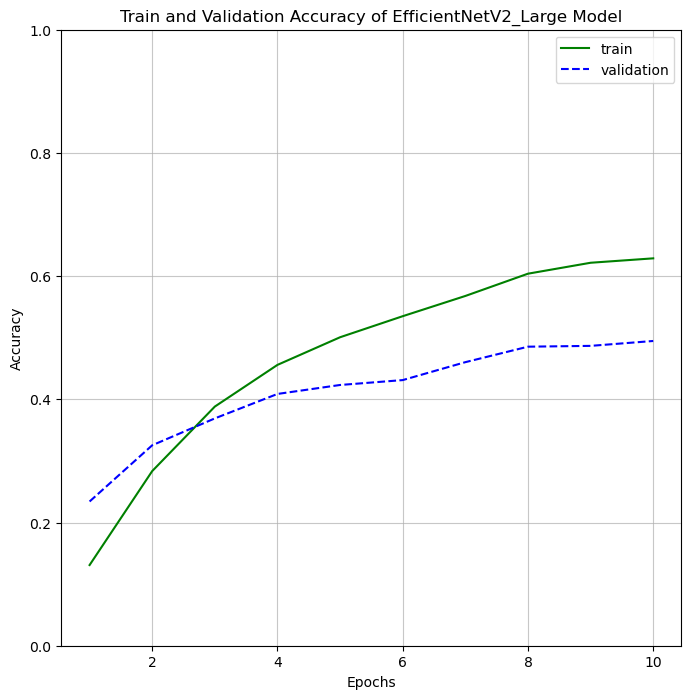

In [105]:
plot_accuracy(epoch_efficientnetv2, result_efficientnetv2.history, 'EfficientNetV2_Large')

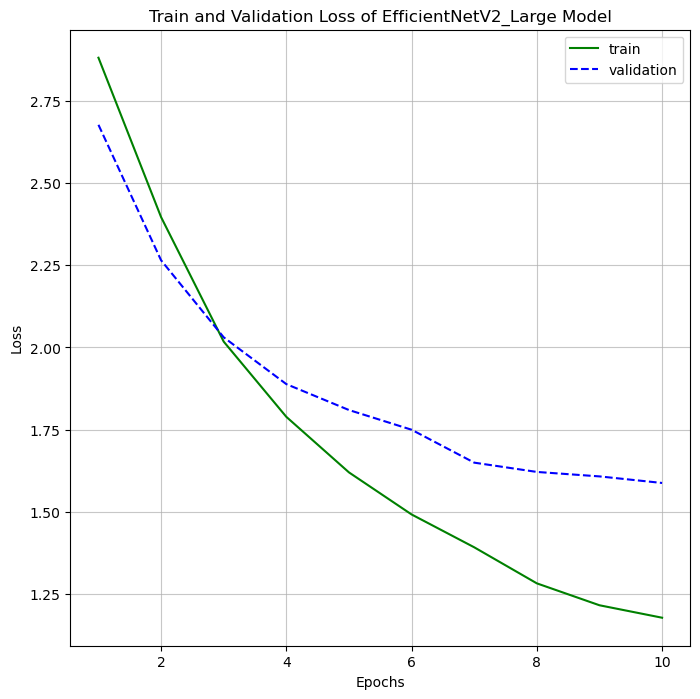

In [106]:
plot_loss(epoch_efficientnetv2, result_efficientnetv2.history, 'EfficientNetV2_Large')

1/1 [==============================] - 1s 1s/step


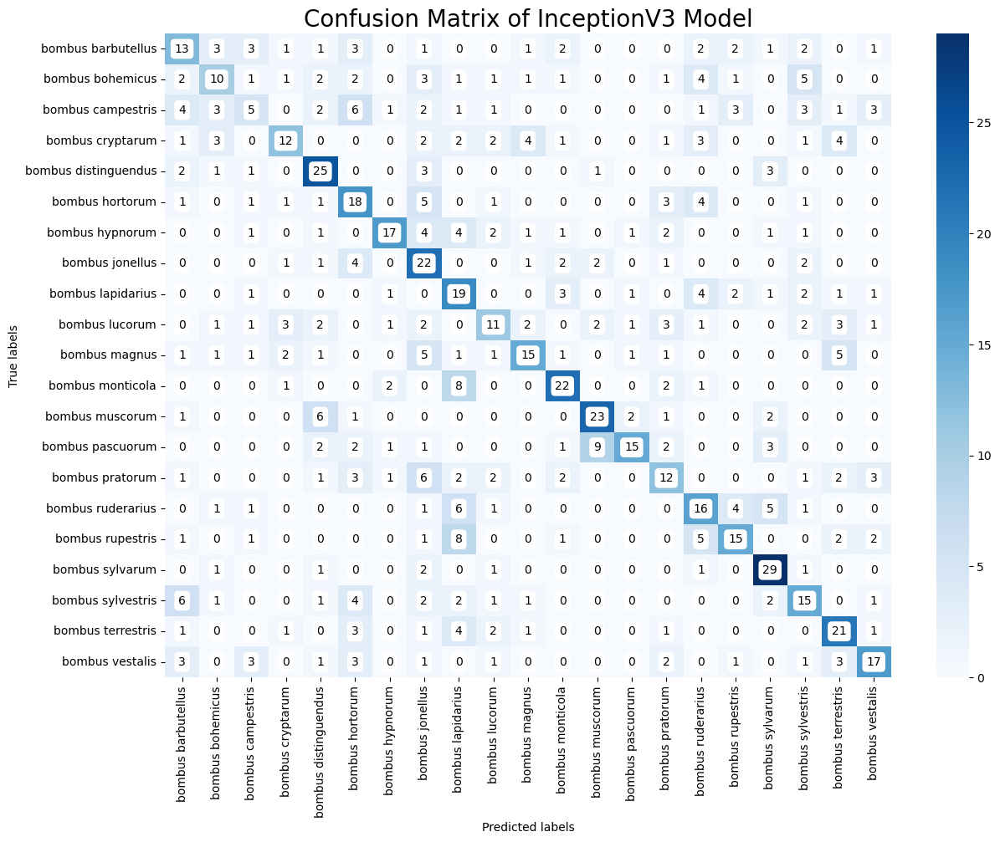

In [31]:
plot_confusion_matrix(model_efficientnetv2, validate_batches_efficientnet, 'EfficientNetV2 Large')

1/1 [==============================] - 0s 349ms/step


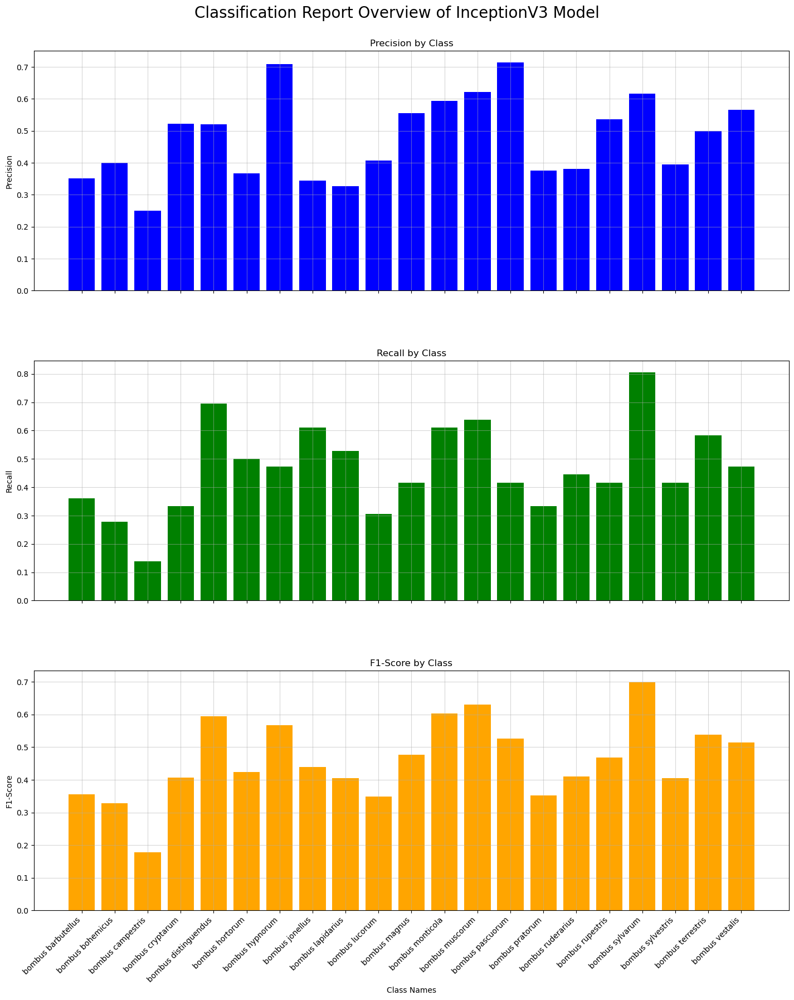

In [32]:
plot_classification_report(model_efficientnetv2, validate_batches_efficientnet, 'EfficientNetV2 Large')

In [33]:
print_classification_report(model_efficientnetv2, validate_batches_efficientnet)

1/1 [==============================] - 0s 350ms/step
Classification Report:
                       precision    recall  f1-score   support

  bombus barbutellus       0.35      0.36      0.36        36
    bombus bohemicus       0.40      0.28      0.33        36
   bombus campestris       0.25      0.14      0.18        36
    bombus cryptarum       0.52      0.33      0.41        36
bombus distinguendus       0.52      0.69      0.60        36
     bombus hortorum       0.37      0.50      0.42        36
     bombus hypnorum       0.71      0.47      0.57        36
     bombus jonellus       0.34      0.61      0.44        36
   bombus lapidarius       0.33      0.53      0.40        36
      bombus lucorum       0.41      0.31      0.35        36
       bombus magnus       0.56      0.42      0.48        36
    bombus monticola       0.59      0.61      0.60        36
     bombus muscorum       0.62      0.64      0.63        36
    bombus pascuorum       0.71      0.42      0.53   

1/1 [==============================] - 0s 365ms/step


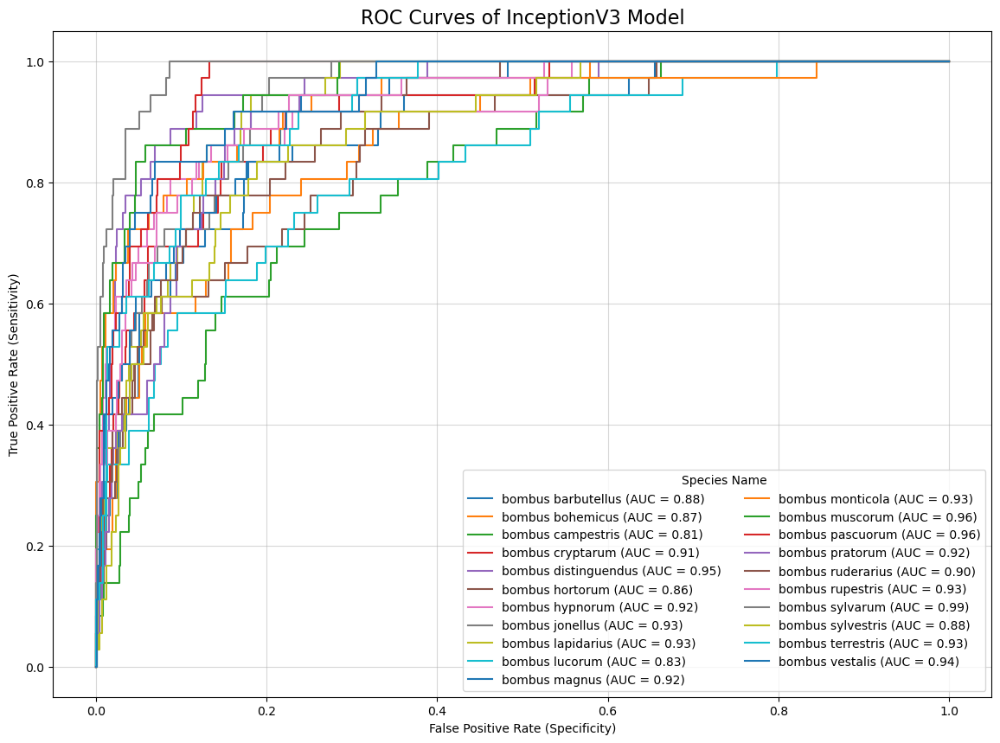

In [34]:
plot_roc_curves(model_efficientnetv2, validate_batches_efficientnet, 'EfficientNetV2 Large')